# The stability of the global average on different window lengths
This notebook outllines different methods that can be used to de-trend the LongRunMIP and ZECMIP time series.

In [1]:
# Standard Library Imports
import os
import sys
from typing import List, Any, Callable, Union, Tuple, Optional
from importlib import reload

# Third-Party Library Imports
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
from functools import partial
from glob import glob
import cftime
import string
from numpy.typing import ArrayLike
# Custom Module Imports
sys.path.append(os.path.join(os.getcwd(), 'Documents', 'zecmip_stabilisation_drafts'))
import constants
sys.path.append(constants.MODULE_DIR)
import open_zecmip
import utils
import signal_to_noise as sn
import plotting_functions
import xarray_extender as xe
import zec_calculation_functions
import signal_to_noise_calculations as sn_calc

import drift_functions
import sn_plotting
import stats



# Suppress Warnings
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=RuntimeWarning, module='dask.*')
warnings.filterwarnings("ignore", category=Warning)
# # Logging
# logger = utils.get_notebook_logger()

Matplotlib created a temporary config/cache directory at /jobfs/115206322.gadi-pbs/matplotlib-uru0q9ga because the default path (/home/563/ab2313/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
sys.path.append(os.path.join(os.getcwd(), 'Documents', 'list_xarray'))
from listXarray import listXarray

In [3]:
np.set_printoptions(precision=2, suppress=True, edgeitems=1)
xr.set_options(display_expand_data=False)

In [4]:
# client.close()

In [5]:
from dask.distributed import Client
client = Client(memory_limit=None, threads_per_worker=1)
client

- State start
- Found stale lock file and directory '/jobfs/115206322.gadi-pbs/dask-scratch-space/scheduler-47rljk84', purging
- Found stale lock file and directory '/jobfs/115206322.gadi-pbs/dask-scratch-space/worker-7zpux2of', purging
- Found stale lock file and directory '/jobfs/115206322.gadi-pbs/dask-scratch-space/worker-3v9sgeln', purging
- Found stale lock file and directory '/jobfs/115206322.gadi-pbs/dask-scratch-space/worker-r_xw0e2l', purging
- Found stale lock file and directory '/jobfs/115206322.gadi-pbs/dask-scratch-space/worker-xcxbabui', purging
- Found stale lock file and directory '/jobfs/115206322.gadi-pbs/dask-scratch-space/worker-rxih3k9f', purging
- Found stale lock file and directory '/jobfs/115206322.gadi-pbs/dask-scratch-space/worker-co1ev7oo', purging
- Found stale lock file and directory '/jobfs/115206322.gadi-pbs/dask-scratch-space/worker-aebqje4l', purging
- Found stale lock file and directory '/jobfs/115206322.gadi-pbs/dask-scratch-space/worker-x7lvfjsn', p

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 28
Total threads: 28,Total memory: 0 B
Status: running,Using processes: True
Comm: tcp://127.0.0.1:41231,Workers: 28
Dashboard: /proxy/8787/status,Total threads: 28
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:34119,Total threads: 1
Dashboard: /proxy/39793/status,Memory: 0 B
Nanny: tcp://127.0.0.1:35691,


# Opening Data

In [6]:
chunks = {'lat':-1, 'lon':-1, 'time':-1, 'ensemble':-1}

In [7]:
a1_raw_xrlist = (open_zecmip.extract_experiment_into_xrlist('1000pgc', 'tas', chunks=chunks, logginglevel='ERROR')
                 .to_dataarray('tas')
                 .sort_by_refkey())

0.3.0


In [8]:
pct_raw_xrlist =  (open_zecmip.extract_experiment_into_xrlist('1pct', 'tas', chunks=chunks)
                   .to_dataarray('tas')
                   .sort_by_refkey())

In [9]:
# pi-Control (not ESM)
esmpi_raw_xrlist = (open_zecmip.extract_experiment_into_xrlist('picontrol', 'tas', chunks=chunks, logginglevel='INFO')
                    .to_dataarray('tas')
                    .isel(ensemble=0)
                    .squeeze('ensemble')
                    .sort_by_refkey()
                    .rename({'latitude':'lat', 'longitude': 'lon'}))

- ACCESS-ESM1-5
-      r1i1p1f1 - /g/data/fs38/publications/CMIP6/CMIP/CSIRO/ACCESS-ESM1-5/piControl/r1i1p1f1/Amon/tas/gn/v20210316/*.nc
- CanESM5
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/piControl/r1i1p1f1/Amon/tas/gn/v20190429/*.nc
-      r1i1p2f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/piControl/r1i1p2f1/Amon/tas/gn/v20190429/*.nc
- MIROC-ES2L
-      r1i1p1f2 - /g/data/oi10/replicas/CMIP6/CMIP/MIROC/MIROC-ES2L/piControl/r1i1p1f2/Amon/tas/gn/v20190823/*.nc
- UKESM1-0-LL
-      r1i1p1f2 - /g/data/oi10/replicas/CMIP6/CMIP/MOHC/UKESM1-0-LL/piControl/r1i1p1f2/Amon/tas/gn/v20200828/*.nc
- MPI-ESM1-2-LR
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/MPI-M/MPI-ESM1-2-LR/piControl/r1i1p1f1/Amon/tas/gn/v20190710/*.nc
-      r2i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/MPI-M/MPI-ESM1-2-LR/piControl/r2i1p1f1/Amon/tas/gn/v20190815/*.nc
- GISS-E2-1-G-CC
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/NASA-GISS/GISS-E2-1-G-CC/piControl/r1i1p1f1/Amon/tas/gn/v2

In [10]:
### ESM-pi-Control
# esmpi_raw_xrlist = (open_zecmip.extract_experiment_into_xrlist('esm-piControl', 'tas', logginglevel='INFO') #esm-piControl'
#                     .to_dataarray('tas')
#                     # .isel(ensemble=0)
#                     # .squeeze('ensemble')
#                     .sort_by_refkey()
#                     .rename({'latitude':'lat', 'longitude': 'lon'}))

In [11]:
esmpi_raw_xrlist

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5 ({'model': 1, 'time': 12000, 'lat': 145, 'lon': 192})
CESM2         ({'model': 1, 'time': 14400, 'lat': 192, 'lon': 288})
CanESM5       ({'model': 1, 'time': 16800, 'lat': 64, 'lon': 128})
GFDL-ESM4     ({'model': 1, 'time': 6000, 'lat': 180, 'lon': 288})
GISS-E2-1-G-CC({'model': 1, 'time': 1980, 'lat': 90, 'lon': 144})
MIROC-ES2L    ({'model': 1, 'time': 6000, 'lat': 64, 'lon': 128})
MPI-ESM1-2-LR ({'model': 1, 'time': 12000, 'lat': 96, 'lon': 192})
NorESM2-LM    ({'model': 1, 'time': 6012, 'lat': 96, 'lon': 144})
UKESM1-0-LL   ({'model': 1, 'time': 22560, 'lat': 144, 'lon': 192})

In [12]:
# Making sure that the ensembles match. NOTE -  this can not be done
# with the piControl
a1_raw_xrlist = a1_raw_xrlist.cross_match_dim(pct_raw_xrlist, 'ensemble')
pct_raw_xrlist = pct_raw_xrlist.cross_match_dim(a1_raw_xrlist, 'ensemble')

In [13]:
# We are just looking at a single ensemble here.
a1_raw_xrlist = a1_raw_xrlist.isel(ensemble=0)
pct_raw_xrlist = pct_raw_xrlist.isel(ensemble=0)
esmpi_raw_xrlist = esmpi_raw_xrlist.isel(ensemble=0)

In [14]:
mask_ds = xr.open_dataset(os.path.join(constants.ZECMIP_LOCAL_REGRIDDED_DIR, 'landsea_mask.nc')); mask_ds

<xarray.Dataset>
Dimensions:  (lat: 96, lon: 192)
Coordinates:
  * lat      (lat) float64 -88.57 -86.72 -84.86 -83.0 ... 83.0 84.86 86.72 88.57
  * lon      (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
Data variables:
    mask     (lat, lon) int64 ...
Attributes:
    Original model:  Made from data found at /g/data/oi10/replicas/CMIP6/C4MI...

In [15]:
# Convert to celcius
a1_raw_xrlist = a1_raw_xrlist - 273.15
pct_raw_xrlist = pct_raw_xrlist - 273.15
esmpi_raw_xrlist = esmpi_raw_xrlist - 273.15

In [16]:
# Can remove a lot of data, as I don't actually need this past the 70 year mark
# Data is montly so times by 12, a do 100 points just for saftery
pct_raw_xrlist = pct_raw_xrlist.isel(time=slice(0, 100 * 12))

In [17]:
# Re-gridding the data
regridding_chunks = {'lat':-1, 'lon':-1, 'time':1000}

esmpi_regrid_xrlist = (esmpi_raw_xrlist.chunk(regridding_chunks)
                       .regrid(target_key='MPI-ESM1-2-LR', method='bilinear', regrid_package='xesmf')
                       .set_refkeys('model')).compute()

a1_regrid_xrlist = (a1_raw_xrlist.chunk(regridding_chunks)
                    .regrid(target_key='MPI-ESM1-2-LR', method='bilinear', regrid_package='climtas')
                    .set_refkeys('model')).compute()

In [18]:
%%time
pct_regrid_xrlist = (pct_raw_xrlist.chunk(regridding_chunks)
                     .regrid(target_key='MPI-ESM1-2-LR', method='bilinear', regrid_package='xesmf')
                     .set_refkeys('model')).compute()

CPU times: user 11.1 s, sys: 2.04 s, total: 13.2 s
Wall time: 22.4 s


In [19]:
# NOTE: There are floating point erros with the grid when using climtas. Need to correct so they
# match later (they appear the same, but the decimals are different)
a1_regrid_xrlist = [
    ds.assign_coords(
        lat=pct_regrid_xrlist[0].lat.values, 
        lon=pct_regrid_xrlist[0].lon.values
    ).drop('ensemble', errors='ignore') 
    for ds in a1_regrid_xrlist.to_list()
]

a1_regrid_xrlist = listXarray(a1_regrid_xrlist, 'model')

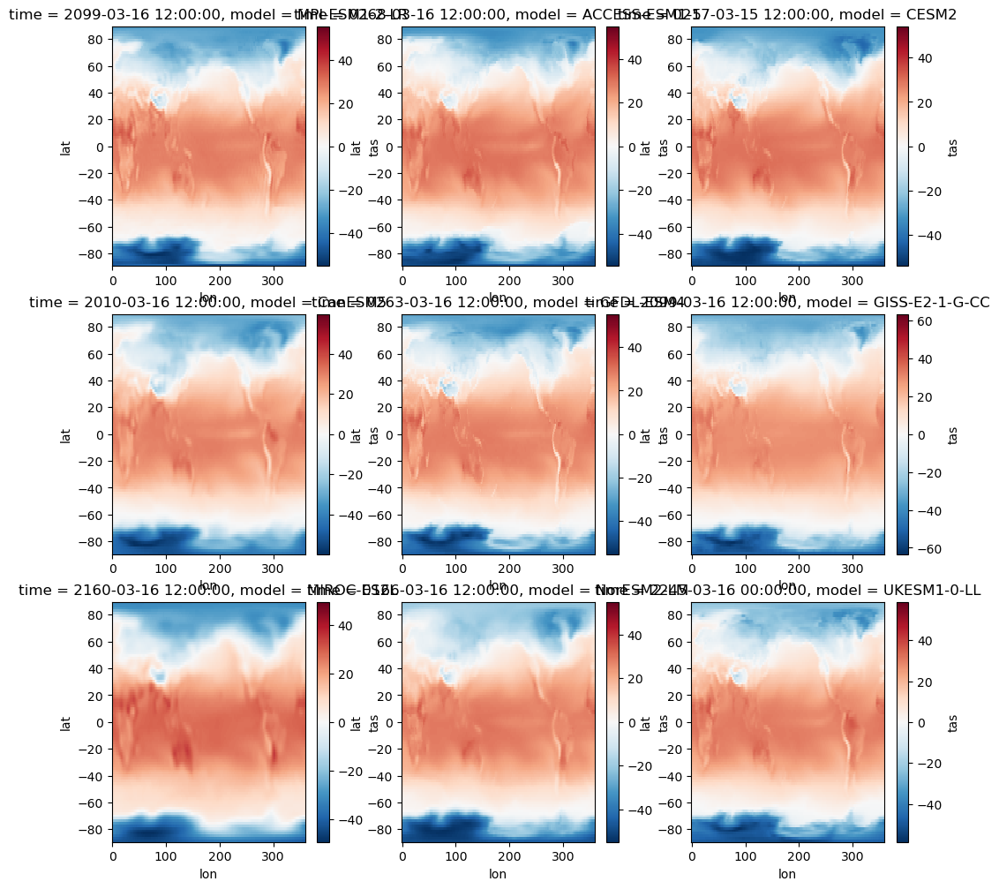

In [20]:
models = a1_regrid_xrlist.refkeys
ncols = 3
nrows = int(len(models)/ncols)
fig = plt.figure(figsize=(12, 12))
axes = [fig.add_subplot(nrows, ncols, i+1) for i in range(ncols*nrows)]

for num, model in enumerate(models):
    ax = axes[num]
    a1_regrid_xrlist[model].isel(time=-10).plot(ax=ax)

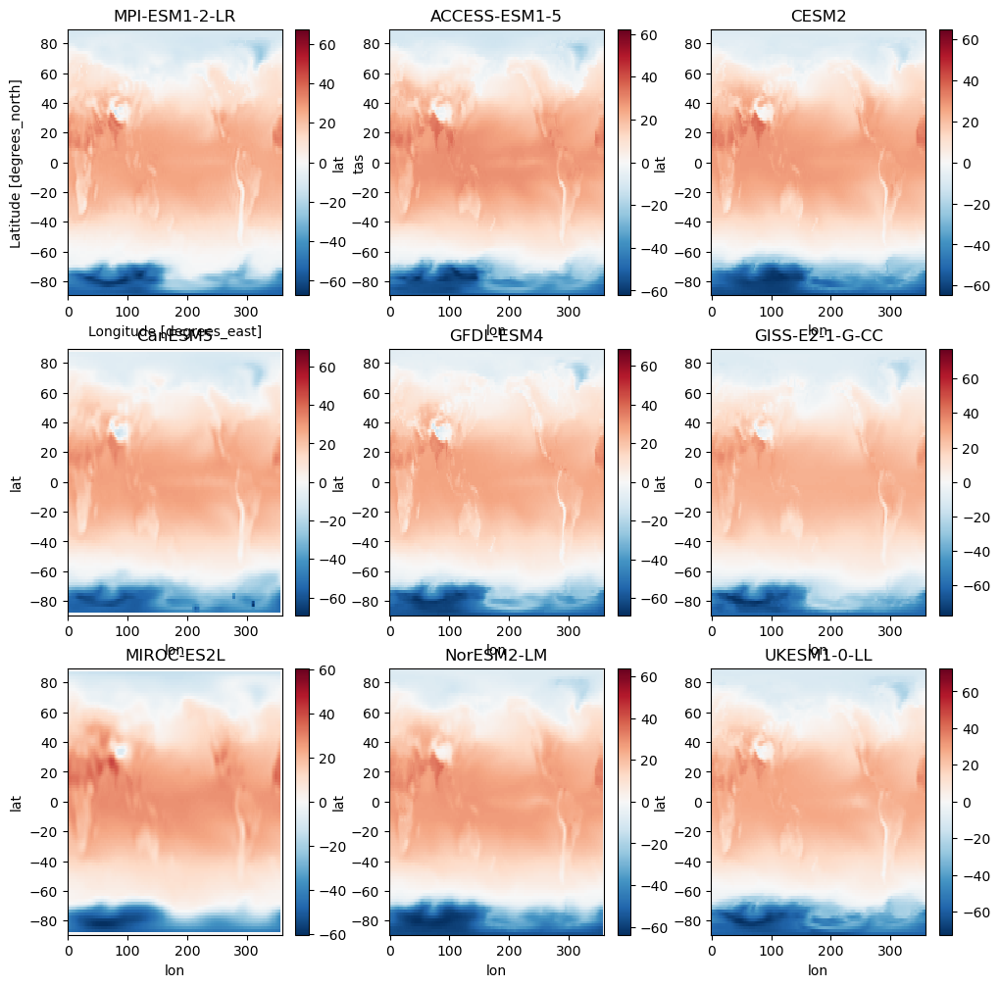

In [21]:
models = a1_regrid_xrlist.refkeys
ncols = 3
nrows = int(len(models)/ncols)
fig = plt.figure(figsize=(12, 12))
axes = [fig.add_subplot(nrows, ncols, i+1) for i in range(ncols*nrows)]

for num, model in enumerate(models):
    ax = axes[num]
    esmpi_regrid_xrlist[model].isel(time=100).plot(ax=ax)
    ax.set_title(model)


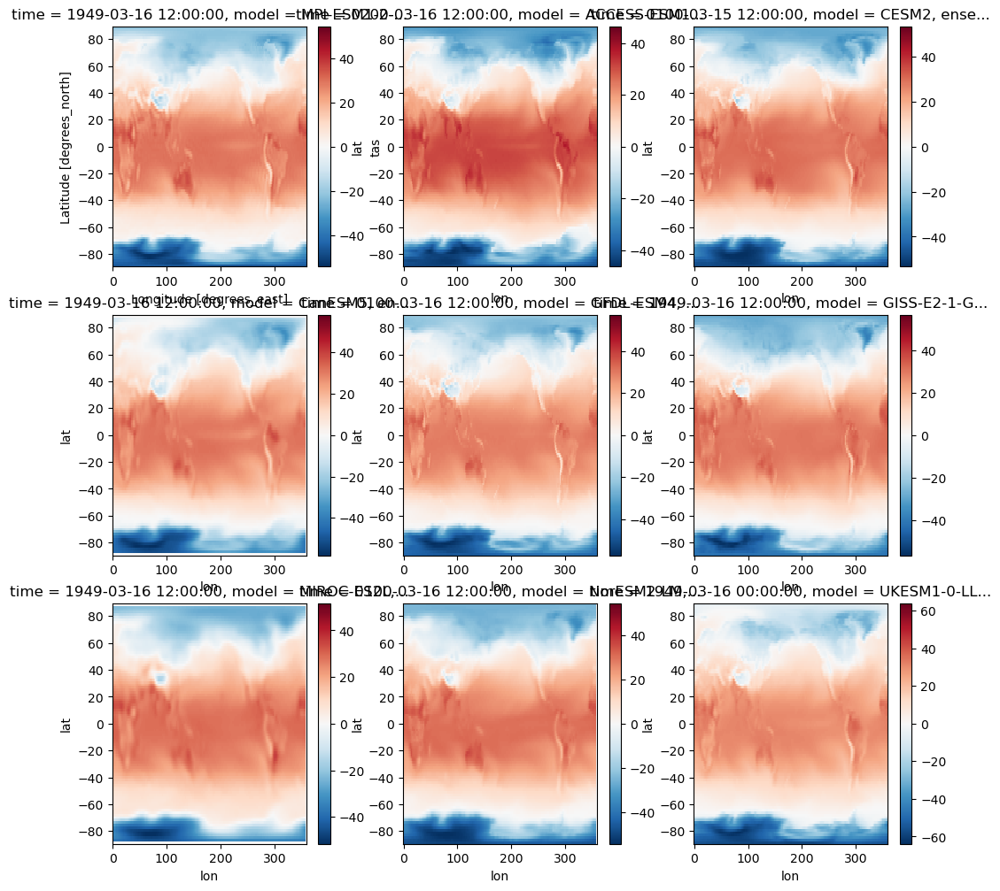

In [22]:
models = a1_regrid_xrlist.refkeys
ncols = 3
nrows = int(len(models)/ncols)
fig = plt.figure(figsize=(12, 12))
axes = [fig.add_subplot(nrows, ncols, i+1) for i in range(ncols*nrows)]

for num, model in enumerate(models):
    ax = axes[num]
    pct_regrid_xrlist[model].isel(time=-10).plot(ax=ax)

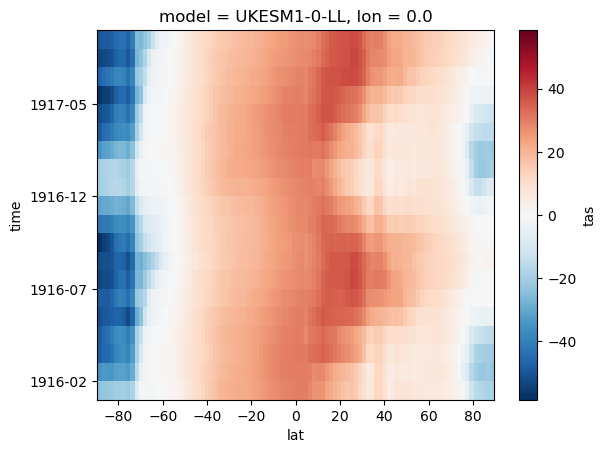

In [23]:
a1_regrid_xrlist['UKESM1-0-LL'].isel(lon=0).isel(time=slice(0,20)).squeeze().plot();

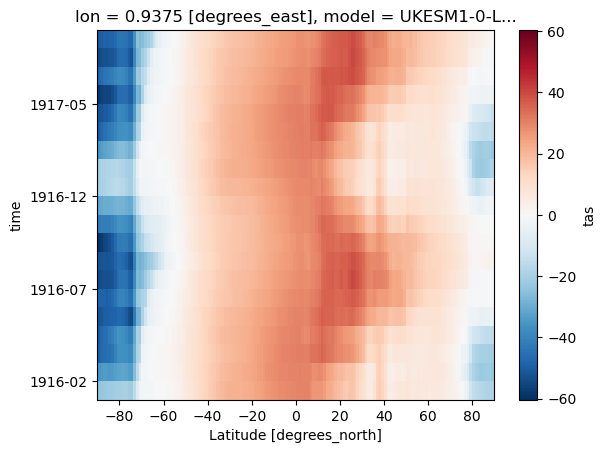

In [24]:
a1_raw_xrlist['UKESM1-0-LL'].isel(lon=0).isel(time=slice(0,20)).squeeze().plot();

In [25]:
# Yearly data transfomration - montly resolution is not needed
esmpi_xrlist = esmpi_regrid_xrlist.chunk({'time':-1}).resample(time='Y').mean(dim='time').set_refkeys('model')
pct_xrlist = pct_regrid_xrlist.chunk({'time':-1}).resample(time='Y').mean(dim='time').set_refkeys('model')
a1_xrlist = a1_regrid_xrlist.chunk({'time':-1}).resample(time='Y').mean(dim='time').set_refkeys('model')

In [26]:
# Can see this in the global mean time series. But this has errors after 1000
esmpi_xrlist['CanESM5'] = esmpi_xrlist['CanESM5'].isel(time=slice(None, 1000))

In [27]:
a1_xrlist

key_dim = model


Number of da/ds: 9
---------------
MPI-ESM1-2-LR ({'model': 1, 'time': 185, 'lat': 96, 'lon': 192})
ACCESS-ESM1-5 ({'model': 1, 'time': 101, 'lat': 96, 'lon': 192})
CESM2         ({'model': 1, 'time': 150, 'lat': 96, 'lon': 192})
CanESM5       ({'model': 1, 'time': 100, 'lat': 96, 'lon': 192})
GFDL-ESM4     ({'model': 1, 'time': 200, 'lat': 96, 'lon': 192})
GISS-E2-1-G-CC({'model': 1, 'time': 180, 'lat': 96, 'lon': 192})
MIROC-ES2L    ({'model': 1, 'time': 248, 'lat': 96, 'lon': 192})
NorESM2-LM    ({'model': 1, 'time': 100, 'lat': 96, 'lon': 192})
UKESM1-0-LL   ({'model': 1, 'time': 330, 'lat': 96, 'lon': 192})

In [28]:
esmpi_xrlist

key_dim = model


Number of da/ds: 9
---------------
MPI-ESM1-2-LR ({'model': 1, 'time': 1000, 'lat': 96, 'lon': 192})
ACCESS-ESM1-5 ({'model': 1, 'time': 1000, 'lat': 96, 'lon': 192})
CESM2         ({'model': 1, 'time': 1200, 'lat': 96, 'lon': 192})
CanESM5       ({'model': 1, 'time': 1000, 'lat': 96, 'lon': 192})
GFDL-ESM4     ({'model': 1, 'time': 500, 'lat': 96, 'lon': 192})
GISS-E2-1-G-CC({'model': 1, 'time': 165, 'lat': 96, 'lon': 192})
MIROC-ES2L    ({'model': 1, 'time': 500, 'lat': 96, 'lon': 192})
NorESM2-LM    ({'model': 1, 'time': 501, 'lat': 96, 'lon': 192})
UKESM1-0-LL   ({'model': 1, 'time': 1880, 'lat': 96, 'lon': 192})

In [29]:
# Time Subsetting
# Subsetting to only first 150 years so all models have equal footing
#esmpi_xrlist = esmpi_xrlist.isel(time=slice(None, 150))

# Reduce time so that the smalles time densions matches. This is at 101 years
a1_xrlist = a1_xrlist.isel(time=slice(None, 100))

In [30]:
# Base period calculation - 20 year average at branch poin
branch_point_mean_xrlist = listXarray([zec_calculation_functions.calculate_branch_average(
    pct_xrlist[model], a1_xrlist[model], logginglevel='INFO') for model in pct_xrlist.refkeys]).set_refkeys('model')

- ['MPI-ESM1-2-LR'] - ['MPI-ESM1-2-LR']
- branch_start_time=cftime.DatetimeProlepticGregorian(1915, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=65
- 

- ['ACCESS-ESM1-5'] - ['ACCESS-ESM1-5']
- branch_start_time=cftime.DatetimeProlepticGregorian(168, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=67
- 

- ['CESM2'] - ['CESM2']
- branch_start_time=cftime.DatetimeNoLeap(68, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=67
- 

- ['CanESM5'] - ['CanESM5']
- branch_start_time=cftime.DatetimeNoLeap(1911, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=61
- 

- ['GFDL-ESM4'] - ['GFDL-ESM4']
- branch_start_time=cftime.DatetimeNoLeap(64, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=63
- 

- ['GISS-E2-1-G-CC'] - ['GISS-E2-1-G-CC']
- branch_start_time=cftime.DatetimeNoLeap(1920, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=70
- 

- ['MIROC-ES2L'] - ['MIROC-ES2L']
- branch_start_time=cftime.DatetimeGregorian(1913, 

In [31]:
# Amomaly time series from the branch point (previosuly called 'experiment_zec_da_anom')
a1_anom_xrlist = (a1_xrlist - branch_point_mean_xrlist)#.compute()

In [32]:
# This way procudes the same as when you average first then take the anomalies. However, we also get the anomaleis
# time series which is useful
zec25_xrlist = a1_anom_xrlist.isel(time=slice(15, 35)).mean(dim='time')
zec50_xrlist = a1_anom_xrlist.isel(time=slice(40, 60)).mean(dim='time')
zec50_xrlist

key_dim = model


Number of da/ds: 9
---------------
MPI-ESM1-2-LR ({'model': 1, 'lat': 96, 'lon': 192})
ACCESS-ESM1-5 ({'model': 1, 'lat': 96, 'lon': 192})
CESM2         ({'model': 1, 'lat': 96, 'lon': 192})
CanESM5       ({'model': 1, 'lat': 96, 'lon': 192})
GFDL-ESM4     ({'model': 1, 'lat': 96, 'lon': 192})
GISS-E2-1-G-CC({'model': 1, 'lat': 96, 'lon': 192})
MIROC-ES2L    ({'model': 1, 'lat': 96, 'lon': 192})
NorESM2-LM    ({'model': 1, 'lat': 96, 'lon': 192})
UKESM1-0-LL   ({'model': 1, 'lat': 96, 'lon': 192})

In [33]:
np.take(esmpi_xrlist.dim('time', output='dict')['CanESM5'], [0,1,2,-3,-2,-1])

array([cftime.DatetimeNoLeap(5201, 12, 31, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(5202, 12, 31, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(5203, 12, 31, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(6198, 12, 31, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(6199, 12, 31, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(6200, 12, 31, 0, 0, 0, 0, has_year_zero=True)],
      dtype=object)

In [34]:
# Reset to time zero
a1_anom_xrlist = a1_anom_xrlist.apply(utils.reset_time_to_0_start)
pct_xrlist = pct_xrlist.apply(utils.reset_time_to_0_start)
esmpi_xrlist = esmpi_xrlist.apply(utils.reset_time_to_0_start)

In [35]:
np.take(esmpi_xrlist.dim('time', output='dict')['CanESM5'], [0,1,2,-3,-2,-1])

array([cftime.datetime(1, 12, 31, 0, 0, 0, 0, calendar='standard', has_year_zero=False),
       cftime.datetime(2, 12, 31, 0, 0, 0, 0, calendar='standard', has_year_zero=False),
       cftime.datetime(3, 12, 31, 0, 0, 0, 0, calendar='standard', has_year_zero=False),
       cftime.datetime(998, 12, 31, 0, 0, 0, 0, calendar='standard', has_year_zero=False),
       cftime.datetime(999, 12, 31, 0, 0, 0, 0, calendar='standard', has_year_zero=False),
       cftime.datetime(1000, 12, 31, 0, 0, 0, 0, calendar='standard', has_year_zero=False)],
      dtype=object)

In [36]:
# These two can be computed as they are small (combined is around  100mb with each 
# model being around 7mb
a1_anom_xrlist = a1_anom_xrlist.compute()
pct_xrlist = pct_xrlist.compute()

In [37]:
# Each model is around 100mb. Parallel across this would be great. But would be 
# too much effort for now
esmpi_xrlist = esmpi_xrlist.compute()

# Converting to datasets then saving

In [38]:
esmpi_xrlist

key_dim = model


Number of da/ds: 9
---------------
MPI-ESM1-2-LR ({'model': 1, 'time': 1000, 'lat': 96, 'lon': 192})
ACCESS-ESM1-5 ({'model': 1, 'time': 1000, 'lat': 96, 'lon': 192})
CESM2         ({'model': 1, 'time': 1200, 'lat': 96, 'lon': 192})
CanESM5       ({'model': 1, 'time': 1000, 'lat': 96, 'lon': 192})
GFDL-ESM4     ({'model': 1, 'time': 500, 'lat': 96, 'lon': 192})
GISS-E2-1-G-CC({'model': 1, 'time': 165, 'lat': 96, 'lon': 192})
MIROC-ES2L    ({'model': 1, 'time': 500, 'lat': 96, 'lon': 192})
NorESM2-LM    ({'model': 1, 'time': 501, 'lat': 96, 'lon': 192})
UKESM1-0-LL   ({'model': 1, 'time': 1880, 'lat': 96, 'lon': 192})

In [39]:
a1_anom_ds = xr.concat(a1_anom_xrlist.to_list(), dim='model', coords='minimal').compute()

In [40]:
esmpi_xrlist = xr.concat(esmpi_xrlist.drop('ensemble').to_list(), dim='model', coords='minimal').compute()

In [41]:
pct_xrlist= xr.concat(pct_xrlist.drop('ensemble').to_list(), dim='model', coords='minimal').compute()

In [ ]:
a1_anom_ds.attrs = {'Experiment': 'ZECMIP A1 Experiment',
                   'Anomaly calculation': 'Anomalies calcualted from the 20 year average from the 1% CO2 simulation at the branch point.',
                   'Re-gridding': 'Re-gridded using climtas with all models matching MIP-ESM1-2-LR model'}

# SN Calculation

In [171]:
a1_anom_trend_ds = stats.trend_fit(a1_anom_ds, method='polynomial', order=3)
a1_anom_detrend_ds = a1_anom_ds - a1_anom_trend_ds

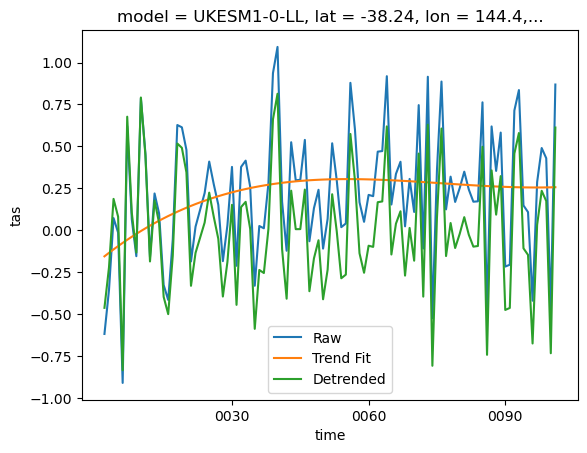

In [172]:
model = 'UKESM1-0-LL'#'CESM2'
a1_anom_ds.sel(lat=-39, lon=144, method='nearest').sel(model=model).plot(label='Raw')
a1_anom_trend_ds.sel(lat=-39, lon=144, method='nearest').sel(model=model).plot(label='Trend Fit')
a1_anom_detrend_ds.sel(lat=-39, lon=144, method='nearest').sel(model=model).plot(label='Detrended')
plt.legend()

In [ ]:
%%time
# # Detrend the data
# a1_anom_trendfit_xrlist = a1_anom_xrlist.apply(stats.trend_fit, method='polynomial', order=3)
# a1_anom_detrend_xrlist = a1_anom_xrlist - a1_anom_trendfit_xrlist

# model = 'UKESM1-0-LL'#'CESM2'
# ensemble=1
# a1_anom_xrlist[model].sel(lat=-39, lon=144, method='nearest').plot(label='Raw')
# a1_anom_trendfit_xrlist[model].sel(lat=-39, lon=144, method='nearest').plot(label='Trend Fit')
# a1_anom_detrend_xrlist[model].sel(lat=-39, lon=144, method='nearest').plot(label='Detrended')
# plt.legend()

In [ ]:
# NOTE: This can only be done if all the time lengths are the same
# If they are different then PLEASE use listxarray
# Converted to xarray - all models now have matching coordinates

# a1_anom_ds = a1_anom_xrlist.concat('model').sortby('model').compute()
# esmpi_ds = esmpi_xrlist.concat('model').sortby('model').compute()
# a1_anom_detrend_ds = a1_anom_detrend_xrlist.concat('model').sortby('model').compute()
# pct_ds = pct_xrlist.concat('model').sortby('model')

In [173]:
windows = np.arange(**constants.ZECMIP_MULTI_WINDOW_PARAMS)
windows

array([10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26,
       27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40])

In [174]:
# Using dask.delayed in several functions below. Scaling the workds
# to match the number of windows - as the calculation for each window will be sent off to a
# a new worker.
client.cluster.scale(len(windows))

-         Start Nanny at: 'tcp://127.0.0.1:33053'
-         Start Nanny at: 'tcp://127.0.0.1:40013'
-         Start Nanny at: 'tcp://127.0.0.1:42301'
- Register worker <WorkerState 'tcp://127.0.0.1:35113', name: 28, status: init, memory: 0, processing: 0>
- Starting worker compute stream, tcp://127.0.0.1:35113
- Starting established connection to tcp://127.0.0.1:60112
- Register worker <WorkerState 'tcp://127.0.0.1:39031', name: 29, status: init, memory: 0, processing: 0>
- Starting worker compute stream, tcp://127.0.0.1:39031
- Starting established connection to tcp://127.0.0.1:60106
- Register worker <WorkerState 'tcp://127.0.0.1:34625', name: 30, status: init, memory: 0, processing: 0>
- Starting worker compute stream, tcp://127.0.0.1:34625
- Starting established connection to tcp://127.0.0.1:60108


In [176]:
%%time

# Calculate the S/R ratio for the A1 experiment. This noise should be the detrended data
sn_ratio_a1_ds = sn_calc.signal_to_noise_ratio_multi_window(
    a1_anom_ds,
    windows,
    detrended_data=a1_anom_detrend_ds,
    parallel=True,
    logginglevel='INFO'
)

- Event loop was unresponsive in Scheduler for 3.25s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 3.35s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 3.46s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 3.46s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 3.46s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 3.46s.  This is often caused by long-r

In [ ]:
%%time

# The S/N ratio for the control period.
sn_ratio_bounds_ds = sn_calc.multi_window_func_with_model_split(
    sn_calc.signal_to_noise_ratio_bounds,
    esmpi_ds,
    windows,
    logginglevel='DEBUG'
)

- ACCESS-ESM1-5
- 10
- 11
- 12
- 13
- 14
- 15
- 16
- 17
- 18
- 19
- 20
- 21
- 22
- 23
- 24
- 25
- 26
- 27
- 28
- 29
- 30
- 31
- 32
- 33
- 34
- 35
- 36
- 37
- 38
- 39
- 40
- CESM2
- 10
- 11
- 12
- 13
- 14
- 15
- 16
- 17
- 18
- 19
- 20
- 21
- 22
- 23
- 24
- 25
- 26
- 27
- 28
- 29
- 30
- 31
- 32
- 33
- 34
- 35
- 36
- 37
- 38
- 39
- 40
- CanESM5
- 10
- 11
- 12
- 13
- 14
- 15
- 16
- 17
- 18
- 19
- 20
- 21
- 22
- 23
- 24
- 25
- 26
- 27
- 28
- 29
- 30
- 31
- 32
- 33
- 34
- 35
- 36
- 37
- 38
- 39
- 40
- GFDL-ESM4
- 10
- 11
- 12
- 13
- 14
- 15
- 16
- 17
- 18
- 19
- 20
- 21
- 22
- 23
- 24
- 25
- 26
- 27
- 28
- 29
- 30
- 31
- 32
- 33
- 34
- 35
- 36
- 37
- 38
- 39
- 40
- GISS-E2-1-G-CC
- 10
- 11
- 12
- 13
- 14
- 15
- 16
- 17
- 18
- 19
- 20
- 21
- 22
- 23
- 24
- 25
- 26
- 27
- 28
- 29
- 30
- 31
- 32
- 33
- 34
- 35
- 36
- 37
- 38
- 39
- 40
- MIROC-ES2L
- 10
- 11
- 12
- 13
- 14
- 15
- 16
- 17
- 18
- 19
- 20
- 21
- 22
- 23
- 24
- 25
- 26
- 27
- 28
- 29
- 30
- 31
- 32
- 33
- 34
- 35
- 36
- 37
- 38
- 39

In [ ]:
# Later code gets funky if there are too many workers
client.cluster.scale(6)

In [ ]:
sn_ratio_bounds_ds.window.values

In [ ]:
sn_ratio_bounds_ds

In [ ]:
sn_ratio_a1_ds = sn_ratio_a1_ds.drop('ensemble', errors='ignore')
sn_ratio_bounds_ds = sn_ratio_bounds_ds.drop('ensemble', errors='ignore')

In [ ]:
max_effective_length = 60 #len(sn_ratio_a1_ds.time.values) -  40
max_effective_length

In [ ]:
sn_ratio_a1_ds = sn_ratio_a1_ds.isel(time=slice(None, max_effective_length))#.compute()

In [ ]:
# The S/N ratio that is unstable - e.g. the A1 S/N where the pi-control is unstable
unstable_sn_ds = sn_ratio_a1_ds.where(np.logical_or(
    sn_ratio_a1_ds>sn_ratio_bounds_ds.upper_bound, # Greater than upper-bounds
    sn_ratio_a1_ds<sn_ratio_bounds_ds.lower_bound)
                                     ) # Less than lower bound
# Maybe not needed anymore?
unstable_sn_ds = unstable_sn_ds.transpose(*['window', 'time', 'model', 'lat', 'lon'])

In [ ]:
# Just where the S/N ratio is stable. This is just the inverse of the above dataset
# is an easier way of doing this.
stable_sn_ds = xr.where(np.isnan(unstable_sn_ds), sn_ratio_a1_ds, np.nan)

In [ ]:
# Get the year that stabilisation occurs

# Note: NOt sure why, but if this isn't done in two parts, this returns a tranpose error.
year_stable_kwargs = dict(
    input_core_dims=[['time'], []],
    output_core_dims=[[]],
    vectorize=True,
    dask='parallelized',
    output_dtypes=[np.float]
)

year_stable_all_window_ds1 = xr.apply_ufunc(
    sn.get_year_stable,
    unstable_sn_ds.isel(model=slice(None, 5)).chunk({'window':3, 'model':1}),
    unstable_sn_ds.window,
    **year_stable_kwargs
).compute()

year_stable_all_window_ds2 = xr.apply_ufunc(
    sn.get_year_stable,
    unstable_sn_ds.isel(model=slice(5, None)).chunk({'window':3, 'model':1}),
    unstable_sn_ds.window,
    **year_stable_kwargs
).compute()


year_stable_all_window_ds = xr.concat([year_stable_all_window_ds1, year_stable_all_window_ds2], dim='model')

In [ ]:
# Rename has occured
# rolling_year_stable_local = rolling_year_stable_ds

In [ ]:
year_stable_model_average2.plot.contourf()

In [ ]:
# The year that the climate becomes stable, is the max year
year_stable_ds = year_stable_all_window_ds.max(dim='window')

In [ ]:
year_stable_model_average2 = year_stable_ds.mean(dim='model', skipna=True)#.reduce(np.nanmedian, dim='model')

In [ ]:
a1_raw_xrlist['UKESM1-0-LL'].isel(lon=0, time=10).plot(hue='time');

In [ ]:
a1_xrlist['UKESM1-0-LL'].isel(lon=0).plot(hue='time');

In [ ]:
a1_anom_xrlist['UKESM1-0-LL'].isel(lon=0).plot(hue='time');

In [ ]:
a1_anom_ds.isel(lon=0).sel(model='UKESM1-0-LL').plot()

In [ ]:
sn_ratio_a1_ds.isel(lon=0, window=2).sel(model='UKESM1-0-LL').plot()

In [ ]:
sn_ratio_bounds_ds.isel(lon=0).sel(model='UKESM1-0-LL').upper_bound.plot()

In [ ]:
year_stable_ds.isel(lon=0).plot()

In [ ]:
year_stable_model_average2.isel(lon=slice(0, 4)).plot()

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
year_stable_model_average2.plot(ax=ax)

In [ ]:
# The average uear stable and the uncertainty
year_stable_model_average = xe.get_average_and_uncertainty_across_dim(
    year_stable_ds.to_dataset(name='time'), 'model',
    averaging_method='median', uncertainty_method='max_min').squeeze().compute()

year_stable_model_average

In [ ]:
# Get the 20-year average tempeature anomaly at stabilisation.
stable_anom_da = xr.apply_ufunc(
    sn_calc.get_average_after_stable_year,
    a1_anom_ds,
    rolling_year_stable_window_max_ds,
    input_core_dims=[['time'],[]],
    output_core_dims=[[]],
    output_dtypes=[np.float],
    vectorize=True
)

In [ ]:
stable_anom_da

# Verification
Plots that are not good, but nice to plot to check

In [ ]:
unstable_sn_ds.isel(window=-1, model=1, time=4).plot()

In [ ]:
rolling_year_stable_ds.max(dim='window').plot(col='model', col_wrap=3)

In [ ]:
stable_anom_da.plot(col='model', col_wrap=3, robust=True)

In [ ]:
stable_sn_ds.isel(window=-1, model=1, time=4).plot()

In [ ]:
projection = ccrs.PlateCarree(central_longitude=np.mean(rolling_year_stable_window_max_ds.lon.values))

In [ ]:
import cartopy

In [ ]:
# Assuming rolling_year_stable_window_max_ds is a xarray dataset or dataframe containing the data you want to plot

# Create the plot
plt.figure(figsize=(15, 10))
ax = rolling_year_stable_window_max_ds.plot(col='model', col_wrap=3, levels=np.arange(0, 80, 10), cmap='BuPu',
                                            figsize=(15, 10), 
                                            subplot_kws={'projection': ccrs.PlateCarree()})

# Add coastlines to each subplot
for i, ax in enumerate(ax.axes.flat):
    ax.coastlines()

plt.show()

In [ ]:
projection = ccrs.PlateCarree(central_longitude=-90)
# np.mean(rolling_year_stable_window_max_ds.lon.values)-90

In [ ]:
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111,projection=projection)
rollling_year_stable_local_average.average_value.plot(ax=ax, cmap='BuPu')
ax.coastlines()

In [ ]:
sn_ratio_a1_ds

# Mean Regional

In [ ]:
from typing import NamedTuple
from enum import Enum

In [ ]:
class Region(NamedTuple):
    name: str
    slice: tuple

class regionLatLonTuples(Enum):
    GLOBAL = Region('global', slice(None, None))
    LAND = Region('land', slice(None, None))
    OCEAN = Region('ocean', slice(None, None))
    NH = Region('nh', slice(0, None))
    SH = Region('sh', slice(None, 0))
    TROPICS = Region('tropics', slice(-23, 23))
    MID_LAT_SH = Region('mid_lat_sh', slice(-66, -23))
    MID_LAT_NH = Region('mid_lat_nh', slice(23, 66))
    ARCTIC = Region('arctic', slice(66, None))
    ANTARCTIC = Region('antarctic', slice(None, -66))


NAMING_MAP = {
    'global': 'Global',
    'nh': 'Northern Hemisphere',
    'sh': 'Southern Hemisphere',
    'tropics': 'Tropics',
    'land': 'Land',
    'ocean': 'Ocean',
    'mid_lat_nh': 'Mid Latitudes NH',
    'mid_lat_sh': 'Mid Latitudes SH',
    'arctic': 'Arctic',
    'antarctic': 'Antarctic'}

In [ ]:
def create_regions(binary_emergence_ds: xr.Dataset, land_mask_ds:xr.Dataset) -> xr.Dataset:
    """
    Calculate the percentage of stability for regions based on binary emergence data.

    Parameters:
        binary_emergence_ds (xr.Dataset): Dataset containing binary emergence data.
        land_mask_ds (xr.Dataset): Dataset containing land mask data.
        only_1s_ds (xr.Dataset): Dataset with only values of 1. This is needed as it can differ
                                due to data availability

    Returns:
        xr.Dataset: Dataset with percentage of stability for each region.

    This function calculates the percentage of stability for regions based on binary
    emergence data and land mask information. It assumes the existence of a variable
    'only_1s_ds' that is the same shape as 'binary_emergence_ds' and contains only
    values of 1 where the event has occurred.
    """

    # Calculating the weights
    weights = np.cos(np.deg2rad(binary_emergence_ds.lat))
    weights.name = 'weights'

    # The two regions that need the land-sea make
    NEEDS_MASKING = ['land', 'ocean']

    ds_collection = [] # Storing all the datasets
    points_in_region_dict = {} # The number of 
    for region in regionLatLonTuples:
        region_name = region.value.name.lower()
        lat_slice = region.value.slice
        
        # Select data for the current region
        ds_region = binary_emergence_ds.sel(lat=lat_slice).expand_dims({'region':[region_name]})

        # Apply masking if needed
        if region_name in NEEDS_MASKING:
            mask_to_use_ds = xr.where(land_mask_ds, 1, 0) if region_name == 'land' else xr.where(land_mask_ds, 0, 1) 
            ds_region = ds_region.where(mask_to_use_ds)


        ds_collection.append(ds_region)

    ds_regions = xr.concat(ds_collection, dim='region')

    return ds_regions

## Regional Averages

In [ ]:
a1_anom_regions_ds = create_regions(a1_anom_ds.squeeze(), mask_ds.mask)

In [ ]:
a1_anom_regions_ds.isel(time=10, model=0).plot(col='region', col_wrap=4)

In [ ]:
esmpi_regions_ds = create_regions(esmpi_ds.squeeze(), mask_ds.mask)

In [ ]:
a1_anom_regions_smean_ds = sn.calculate_global_value(a1_anom_regions_ds, 'tas')

In [ ]:
esmpi_regions_smean_ds = sn.calculate_global_value(esmpi_regions_ds, 'tas')

In [ ]:
esmpi_regions_smean_ds.plot(col='region', col_wrap=4, hue='model', x='time')

In [ ]:
a1_anom_regions_smean_ds.plot(col='region', col_wrap=4, hue='model', x='time')

In [ ]:
REGION_RUN_PARAMS = {'windows': [20, 40]}

In [ ]:
a1_smean_anom_trend_region_ds = stats.trend_fit(a1_anom_regions_smean_ds, method='polynomial', order=3)

In [ ]:
a1_smean_anom_detrend_region_ds = a1_anom_regions_smean_ds - a1_smean_anom_trend_region_ds

In [ ]:
a1_smean_anom_detrend_region_ds.plot(col='region', col_wrap=4, hue='model', x='time')

In [ ]:
a1_smean_anom_trend_region_ds.plot(col='region', col_wrap=4, hue='model', x='time')

In [ ]:
a1_smean_anom_detrend_region_ds, a1_anom_regions_smean_ds, esmpi_regions_smean_ds

In [ ]:
# Try this with scaling workers to the number of windows
sn_ratio_bounds_region_ds = sn_calc.multi_window_func_with_model_split(
    sn_calc.signal_to_noise_ratio_bounds,
    esmpi_regions_smean_ds,
    windows,
    logginglevel='DEBUG'
)

In [ ]:
%%time
sn_multi_rolling_smean_region_ds = sn_calc.signal_to_noise_ratio_multi_window(
    a1_anom_regions_smean_ds,
    windows,
    detrended_data=a1_smean_anom_detrend_region_ds,
    parallel=True,
    logginglevel='INFO'
)

In [ ]:
sn_multi_rolling_smean_region_ds = sn_multi_rolling_smean_region_ds.isel(time=slice(None, max_effective_length))

In [ ]:
sn_multi_rolling_smean_region_ds.sel(window=40).plot(col='region', col_wrap=4, hue='model', x='time')

In [ ]:
unstable_sn_region_ds = sn_multi_rolling_smean_region_ds.where(np.logical_or(
    sn_multi_rolling_smean_region_ds>sn_ratio_bounds_region_ds.upper_bound,
    sn_multi_rolling_smean_region_ds<sn_ratio_bounds_region_ds.lower_bound,))
# unstable_sn_region_ds = unstable_sn_region_ds.transpose(*['window', 'time', 'model', 'lat', 'lon'])

In [ ]:
year_stable_smean_region_ds = xr.apply_ufunc(
    sn.get_year_stable,
    unstable_sn_region_ds.chunk({'window':10, 'model':1}),
    unstable_sn_region_ds.window,
    **year_stable_kwargs
).compute()


In [ ]:
year_stable_smean_region_ds = year_stable_smean_region_ds.max(dim='window')

In [ ]:
# year_stable_smean_region_ds = sn.get_stable_year_ds(sn_multi_rolling_smean_region_ds, max_effective_length=60).squeeze()

In [ ]:
year_stable_smean_region_ds

In [ ]:
import seaborn as sns

In [ ]:
year_stable_smean_region_ds.name = 'time'

In [ ]:
year_stable_smean_region_dataframe = year_stable_smean_region_ds.to_pandas()

In [ ]:
year_stable_smean_region_dataframe.mean(axis=1).plot.bar()

In [ ]:
plt.figure(figsize=(8, 6))
heatmap = sns.heatmap(year_stable_smean_region_dataframe.astype(int), annot=True, cmap='BuPu')

# # Change the ticks to long names
# heatmap.set_xticklabels([toe_const.NAME_CONVERSION_DICT[text.get_text()] for text in heatmap.get_xticklabels()])
# heatmap.set_yticklabels([toe_const.NAME_CONVERSION_DICT[text.get_text()] for text in heatmap.get_yticklabels()])

# plt.title('Pattern Correlations');
# plt.xticks(rotation=45);  # Rotate x-axis labels for better readability
# plt.yticks(rotation=0) ;

## Individual Grid Cells

In [ ]:
rolling_year_stable_local_regions = create_regions(rolling_year_stable_local.squeeze(), mask_ds.mask)

In [ ]:
rolling_year_stable_local_regions.isel(model=0, window=1).plot(col='region', col_wrap=3)

In [ ]:
window = 40
regions = rolling_year_stable_local_regions.region.values

fig = plt.figure(figsize=(8, 15))
axes = [fig.add_subplot(len(regions), 1, i+1) for i in range(len(regions))]
for num,region in enumerate(regions):

    ax = axes[num]
    arr = rolling_year_stable_local_regions.sel(region=region, window=window).values.flatten()
    arr = arr[np.isfinite(arr)]
    arr = arr[arr>0]
    ax.hist(arr, bins=np.arange(0, 60, 1), density=True)
    ax.set_ylabel(region)

# Percent Regions

In [ ]:
def fraction_comparison(ds_num, ds_denom, weights):
    """
    Calculate the percentage by comparing two datasets.

    Parameters:
        ds_num (xarray.Dataset): Numerator dataset.
        ds_denom (xarray.Dataset): Denominator dataset.
        weights (xarray.DataArray): Weights for the calculation.

    Returns:
        xarray.DataArray: Dataset containing the percentage.
    """
    # Calculate the sum of the numerator dataset weighted by weights
    ds_num_sum = ds_num.weighted(weights).sum(dim=['lat', 'lon'])

    # Calculate the sum of the denominator dataset weighted by weights
    ds_denom_sum = ds_denom.weighted(weights).sum(dim=['lat', 'lon'])

    # Calculate the percentage
    percent_ds = ds_num_sum / ds_denom_sum * 100

    return percent_ds

In [ ]:
def calculate_percent_stable_all_regions(binary_ds: xr.Dataset, weights: xr.Dataset, full_ds: xr.Dataset, mask_ds: xr.Dataset) -> xr.Dataset:
    """
    Calculate percentages of stability for different regions.

    Parameters:
        binary_ds (xarray.Dataset): Binary dataset with stability information.
        weights (xarray.Dataset): Weights to be applied for calculation.
        full_ds (xarray.Dataset): Full dataset for comparison.
        mask_ds (xarray.Dataset): Dataset with mask information.

    Returns:
        xarray.Dataset: Dataset containing percentages of stability for various regions.
    """
    # Calculate global stability percentage
    global_percent_ds = fraction_comparison(binary_ds, full_ds, weights).expand_dims('region').assign_coords(region=['gl'])

    # Calculate land-only stability percentage
    land_percent_ds = fraction_comparison(binary_ds.where(mask_ds.mask), full_ds.where(mask_ds.mask), weights).expand_dims('region').assign_coords(region=['land'])

    # Calculate ocean stability percentage
    ocean_percent_ds = fraction_comparison(binary_ds.where(mask_ds.mask == 0), full_ds.where(mask_ds.mask == 0), weights).expand_dims('region').assign_coords(region=['ocean'])

    # Calculate Northern Hemisphere stability percentage
    nh_percent_ds = fraction_comparison(binary_ds.sel(lat=slice(0, None)), full_ds.sel(lat=slice(0, None)), weights).expand_dims('region').assign_coords(region=['nh'])

    # Calculate Southern Hemisphere stability percentage
    sh_percent_ds = fraction_comparison(binary_ds.sel(lat=slice(None, 0)), full_ds.sel(lat=slice(None, 0)), weights).expand_dims('region').assign_coords(region=['sh'])

    # Calculate Tropics stability percentage
    tropics_percent_ds = fraction_comparison(binary_ds.sel(lat=slice(-23, 23)), full_ds.sel(lat=slice(-23, 23)), weights).expand_dims('region').assign_coords(region=['tropics'])

    # Calculate Mid-Latitude Southern Hemisphere stability percentage
    mid_lat_sh_percent_ds = fraction_comparison(binary_ds.sel(lat=slice(-66, -23)), full_ds.sel(lat=slice(-66, -23)), weights).expand_dims('region').assign_coords(region=['mid_sh'])

    # Calculate Mid-Latitude Northern Hemisphere stability percentage
    mid_lt_nh_percent_ds = fraction_comparison(binary_ds.sel(lat=slice(23, 66)), full_ds.sel(lat=slice(23, 66)), weights).expand_dims('region').assign_coords(region=['mid_nh'])

    # Calculate Antarctic stability percentage
    antarctic_ds = fraction_comparison(binary_ds.sel(lat=slice(None, -66)), full_ds.sel(lat=slice(None, -66)), weights).expand_dims('region').assign_coords(region=['antarctic'])

    # Calculate Arctic stability percentage
    arctic_ds = fraction_comparison(binary_ds.sel(lat=slice(66, None)), full_ds.sel(lat=slice(66, None)), weights).expand_dims('region').assign_coords(region=['arctic'])

    # Concatenate all region datasets
    all_region_ds = xr.concat([global_percent_ds, nh_percent_ds, sh_percent_ds, land_percent_ds, ocean_percent_ds, 
                               arctic_ds, antarctic_ds, mid_lt_nh_percent_ds, mid_lat_sh_percent_ds, tropics_percent_ds ], dim='region')

    all_region_ds.name = 'percent_stable'
    return all_region_ds

In [ ]:
def calculate_returned_binary_ds(arr: ArrayLike, year_of_emergence: int, time_years: ArrayLike) -> ArrayLike:
    """
    Calculates a binary array representing the emergence of an event.

    Parameters:
        arr (ArrayLike): Input array.
        year_of_emergence (int): Year of the event's emergence.
        time_years (ArrayLike): Array of years.

    Returns:
        ArrayLike: Binary array representing the event's emergence.
                   0 before the year_of_emergence, 1 after.

    If year_of_emergence is NaN or all values in arr are NaN, the function
    returns arr unchanged.
    """

    #print(arr.shape, year_of_emergence, end='')
    # If the year_of_emergence is nan or all the values at the location are nan
    # then return nan
    
    if np.isnan(year_of_emergence): return arr

    # The integer arguement of where the time_years equals the emergence arg
    emergence_arg = np.argwhere(time_years == np.round(year_of_emergence))
    
    if len(emergence_arg) == 0:
        print(year_of_emergence)
        return np.nan
    if isinstance(emergence_arg, int): pass
    elif emergence_arg.shape == (1,1): emergence_arg = emergence_arg.item()
    
    to_return = np.zeros_like(arr)
    
    # Set all values to 1 after emergence has occured
    to_return[emergence_arg:] =  1

    return to_return

In [ ]:
# Using the year when each window becomes stable. Create a data set that is
# 0 when unstable and 1 when stable. 
binary_stability_ds = xr.apply_ufunc(
    calculate_returned_binary_ds,
    unstable_sn_ds.isel(window=0), # This is just a place holder, used for the shape
    year_stable_ds,
    unstable_sn_ds.time.dt.year-1, # Subtracting one, as this is ofset by 1
    input_core_dims = [['time'], [], ['time']],
    output_core_dims=[['time']],
    vectorize=True,
    dask='parallelized'
)

In [ ]:
year_stable_ds.plot(col='model', col_wrap=3)

In [ ]:
binary_stability_ds.isel(time=-2).plot(col='model', col_wrap=3)

In [ ]:
# stable_sn_da_all_window.sum(dim=['lat', 'lon']).plot(hue='model');

In [ ]:
# Calculating the weights
weights = np.cos(np.deg2rad(mask_ds.lat))
weights.name = 'weights'

In [ ]:
# A dataset with every point as 1, this is useful for getting the maximum weighted sum for a field
full_ds =  xr.where(np.isfinite(binary_stability_ds), 1, 1)

In [ ]:
# Where the values are stable replace with 1, otherwise replace with 0
binary_ds = binary_stability_ds#xr.where(np.isfinite(stable_sn_da_all_window), 1, 0)

In [ ]:
# The percent of points that are stable each each timestep
percent_stable_timeseries_ds = calculate_percent_stable_all_regions(binary_ds, weights, full_ds, mask_ds)

percent_stable_timeseries_ds = percent_stable_timeseries_ds.compute()

In [ ]:
percent_stable_timeseries_ds

In [ ]:
# Opposite of the above: Stable replace with 0n and unstable is 1.
# The opposite is need as we are looking at when the percetage of unstable points becomes 0
binary_unstable_ds = xr.where(stable_sn_da_all_window,0, 1)#
binary_unstable_warm_ds = binary_unstable_ds.where(stable_anom_da>0)
binary_unstable_cool_ds = binary_unstable_ds.where(stable_anom_da<=0)

In [ ]:
number_warm_ds = fraction_comparison(binary_unstable_warm_ds, full_ds, weights).expand_dims(region=['global_warm']) 
number_cool_ds = fraction_comparison(binary_unstable_cool_ds, full_ds, weights).expand_dims(region=['global_warm']) 

In [ ]:
# Too clutered when adding in the cooling and warmign trend averages
percent_stable_timeseries_average_ds = percent_stable_timeseries_ds.median(dim='model')
percent_stable_timeseries_average_ds

In [ ]:
region_order = ['gl', 'nh', 'sh', 'land', 'ocean', 'arctic', 'antarctic', 'mid_nh', 'mid_sh', 'tropics']
percent_stable_timeseries_ds = percent_stable_timeseries_ds.sel(region=region_order)

## Plotting

In [ ]:
experiment_params = constants.EXPERIMENTS_TO_RUN[0]
experiment_params

In [ ]:
units = constants.VARIABLE_INFO[experiment_params["variable"]]["units"]
longname = constants.VARIABLE_INFO[experiment_params["variable"]]['longname']
hemisphere_title = string.capwords(experiment_params['hemisphere'].replace('_', ' '))
mask_title = f'({experiment_params["mask"]} only)' if experiment_params["mask"] else ''

### Percent of Year Stable

In [ ]:
NAMING_MAP = {'gl': 'Global',
 'nh': 'Northern Hemisphere',
 'sh': 'Southern Hemisphere',
 'tropics': 'Tropics',
 'land': 'Land',
 'ocean': 'Ocean',
 'mid_nh': 'Mid Latitudes NH',
 'mid_sh': 'Mid Latitudes SH',
 'arctic': 'Arctic',
 'antarctic': 'Antarctic',
 'global_warm': 'Warming Trends',
 'global_cool': 'Cooling Trends'}

In [ ]:
linestyles = ['--', '-'] * int(np.ceil(len(percent_stable_timeseries_ds.model.values)/2))
linestyles

In [ ]:
# linestyle_dict = {'ACCESS-ESM1-5': '--','CESM2': '-','CanESM5': '--','GFDL-ESM4': '-','GISS-E2-1-G-CC': '--',
#                   'MIROC-ES2L': '-','MPI-ESM1-2-LR': '--','NorESM2-LM': '-','UKESM1-0-LL': '--'}

In [ ]:
ncols = 2
nrows = int(np.ceil(len(constants.ZECMIP_MODEL_PARAMS)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=.2, wspace=.1)
axes = [fig.add_subplot(gs[i]) for i in range(10)]


time = number_cool_ds.time.dt.year.values

for num, model in enumerate(constants.ZECMIP_MODEL_PARAMS):

    ax = axes[num+1]
    ax.plot(time, number_cool_ds.sel(model=model).squeeze().values, color='blue', label='Cooling')
    ax.plot(time, number_warm_ds.sel(model=model).squeeze().values, color='red', label='Warming')
    
    ax.annotate(model, xy=(1, 0.85), fontsize=14, xycoords='axes fraction', ha='right')
    
    sn_plotting.format_xticks(axes[num], time, time-1)

    if num==3: ax.set_ylabel('Percent of\nLand Area Unstable(%)', fontsize=14)

ax = axes[0]
ax.plot(time, number_cool_ds.median(dim='model').squeeze().values, color='blue', label='Cooling')
ax.plot(time, number_warm_ds.median(dim='model').squeeze().values, color='red', label='Warming')

for ax in axes:
    ax.grid(True, alpha=0.5, c='grey', linestyle='--')
    ax.set_xlim(0, 50)
    ax.set_ylim(0, 100)    

ax.annotate('Median', xy=(1, 0.85), ha='right', fontsize=14, xycoords='axes fraction')
sn_plotting.format_xticks(axes[num], time, time-1)


# Place the legend at the center just above the first row of plots
# Adjust the bbox_to_anchor values to center the legend
leg = axes[1].legend(ncol=2, bbox_to_anchor=[-0.05, 1.5], loc='upper center', fontsize=14)
axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25);
axes[-2].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25);

In [ ]:
### Plot set-up

line_plot_kwargs = dict(xlabel='Time After Emission Cessation (Years)', labelpad=70, ncol=2,
                        exp_type='zecmip', font_scale=1.8, xlim=(0, 49), bbox_to_anchor=(1, 0.75))
left_kwargs = dict(ylabel='Percent\nStable (%)')


line_plot_kwargs['ylim'] = (0, 100) #if window == 40 else (40, 100)

### Plot Creation
nplots = len(percent_stable_timeseries_ds.region.values)+1
fig = plt.figure(figsize=(12*2, 4*nplots))
gs = gridspec.GridSpec(int(np.ceil(nplots/2))+1, 2, height_ratios=[1.5]+[0.2] + [1]*int(np.ceil((nplots-2)/2)), wspace=0, hspace=0)
ax0 = fig.add_subplot(gs[0, :]); axes = [fig.add_subplot(gs[i+4]) for i in range(nplots-2)]
axes.insert(0, ax0)

for num, reg in enumerate(percent_stable_timeseries_ds.region.values):
    kwargs_to_use = left_kwargs if ((num%2) or (num==0)) else {}
    sn_plotting.plot_all_coord_lines(percent_stable_timeseries_ds.sel(region=reg), fig=fig, ax=axes[num],
                                     title=NAMING_MAP[reg], #linestyle=linestyle_dict, 
                                     add_legend=False if num < len(percent_stable_timeseries_ds.region.values)-1 else True,
                                     logginglevel='ERROR', legend_fontsize=16,
                                     **kwargs_to_use, **line_plot_kwargs);

for num, ax in enumerate(axes):
    title = ax.get_title()
    ax.set_title('')
    # Remove the first and last yticks so it doesn't overlap with the next/previous plot.
    ax.set_yticks(np.take(ax.get_yticks(), np.arange(1, len(ax.get_yticks())-1)))
    ax.annotate(title, xy=(0.01, 0.85), xycoords='axes fraction', size=constants.PlotConfig.title_size*1.4)
    if not num%2 and num >1: ax.set_yticklabels([])
    if 1 < num < 8: ax.set_xticklabels([]) # Need or the last number can still be seen

In [ ]:

line_plot_kwargs = dict(xlabel='Time After Emission Cessation (Years)', labelpad=70, ncol=2, exp_type='zecmip', font_scale=1.8,
                        xlim=(0, 49), ylim=(0, 100), bbox_to_anchor=(1.1,1))
left_kwargs = dict( ylabel='Percent of\nPoints Stable (%)')

window = 40
plt.style.use('default')
nplots = len(percent_stable_timeseries_ds.region.values)+1
fig = plt.figure(figsize=(12*2, 4*nplots))
gs = gridspec.GridSpec(int(np.ceil(nplots/2)), 2, height_ratios=[1.5] + [1]*int(np.ceil((nplots-2)/2)), wspace=0.1, hspace=0.4)
ax0 = fig.add_subplot(gs[0, :]); axes = [fig.add_subplot(gs[i+2]) for i in range(nplots-2)]
axes.insert(0, ax0)

for num, reg in enumerate(percent_stable_timeseries_ds.region.values):
    kwargs_to_use = left_kwargs if ((num%2) or (num==0)) else {}
    sn_plotting.plot_all_coord_lines(percent_stable_timeseries_ds.sel(region=reg), fig=fig, ax=axes[num],
                                     title=NAMING_MAP[reg],add_legend=False if num < len(percent_stable_timeseries_ds.region.values)-1 else True, liensytle=linestyles,
                                     **kwargs_to_use, **line_plot_kwargs);
    #axes[num].set_xlim([stable_sn_da.time.values[0], stable_sn_da.time.values[-1]]); axes[num].set_ylim(0, 100)

In [ ]:
line_plot_kwargs_median = dict(xlabel='Time After Emission Cessation (Years)', ylabel='',
                               labelpad=70, font_scale=1.1,xlim=(0, 49), ylim=(0, 101), consensus=False)

fig = plt.figure(figsize=(12, 4*2))
ax = fig.add_subplot(111)

fig, ax, leg = sn_plotting.plot_all_coord_lines(
    percent_stable_timeseries_ds.median(dim='model'),
    ax=ax, coord='region', exp_type='region', linestyle=linestyles, 
    add_legend=True, bbox_to_anchor=(1.03,-0.15), **line_plot_kwargs_median)

ax.set_ylabel('Percent Stable (%)', size=18, ha='left')

# Update the legend elements. Get the legend labels
labels = [text.get_text() for text in leg.get_texts()]
for old_label, new_label in NAMING_MAP.items():
    try:
        leg.get_texts()[labels.index(old_label)].set_text(new_label)
    except ValueError: pass


legend_handles = leg.legendHandles
legend_texts = [t.get_text() for t in leg.get_texts()]
new_order = ['Global'] + [t for t in legend_texts if t != 'Global']

# Create a new legend
leg = ax.legend([handle for _, handle in sorted(zip(legend_texts, legend_handles), 
                                                key=lambda pair: new_order.index(pair[0]))], new_order, 
               fontsize=15)

# 1D Lat Lon Selection

In [ ]:
from classes import LocationsLatLon
import classes

In [ ]:
def get_location_title(location: LocationsLatLon) -> str:
    lat,lon = location.value

    str_lat = str(abs(round(lat, 1)))
    str_lon = str(abs(round(lon, 1)))
    str_lat = str_lon + 'N' if lat > 0 else str_lon + 'S'
    str_lon = str_lon +'E' if lon > 0 else str_lon + 'W'
    location_name = location.name.replace('_', ' ').title()
    location_title = f'{location_name}'  + r' ({}, {})'.format(str_lat, str_lon)
    return location_title

In [ ]:
def plot_single_point_all_models(ds, location: LocationsLatLon, length =50, start=0,
                                 fig=None, ax=None, legend_on: bool=True, bbox_to_anchor = [-0.03, 1],
                                ylabel=None, xlabel=None, ylim=None, linestyle=':'):
    lat,lon = location.value
    plt.style.use('seaborn-darkgrid')

    models = [model for model in list(constants.ZECMIP_MODEL_PARAMS) if model in ds.model.values]

    if fig is None: fig  = plt.figure(figsize=(10,8)); ax = fig.add_subplot(111)
        
    for model in models:
        da = (ds.sel(model=model)
              .isel(time=slice(start, length))
              .sel(lat=lat, lon=lon, method='nearest')
             )
        color = constants.ZECMIP_MODEL_PARAMS[model]['color']
        da.plot(ax=ax, label=model, linestyle=linestyle, color=color)
    if legend_on:
        leg = ax.legend()
        ax.legend(ncol=1, fontsize=15, bbox_to_anchor=bbox_to_anchor, frameon=True)
        leg.get_title().set_fontsize('15')
    ax.set_xlim(ds.time.values[start], ds.time.values[length])
    
    ax.set_title(get_location_title(location))
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    
    if ylabel: ax.set_ylabel(ylabel,fontsize = 16, rotation = 0, labelpad = 55)
    if xlabel: ax.set_xlabel(xlabel, fontsize=16)
    if ylim: ax.set_ylim(ylim)
        
    return fig, ax

In [ ]:
def local_point_plot(values_ds, stable_values_ds, window, location, stable_points, fig=None, ax=None,
                    legend_on=True, ylabel=None, xlabel=None, ylim=None):

    fig, ax = plot_single_point_all_models(
        stable_values_ds.sel(window=window), location, fig=fig, ax=ax, linestyle='solid',
        legend_on=legend_on)

    plot_single_point_all_models(values_ds, location, fig=fig, ax=ax, legend_on=False,
      ylabel=f'{ylabel_name}\n{constants.VARIABLE_INFO[variable]["units"]}',
                                xlabel='Time After Emission Cessation (Years)')

    for model, point in stable_points[window].items():
        color = color = constants.MODEL_PARAMS[model.lower()]['color']
        ax.scatter(point[0], point[1], zorder=100, color=color, edgecolor='k', s=25)
        
    if ylabel: ax.set_ylabel(ylabel,fontsize = 16, rotation = 0, labelpad = 55)
    if xlabel: ax.set_xlabel(xlabel, fontsize=16)
    if ylim:ax.set_ylim(ylim)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
        
    return fig, ax

In [ ]:
def plot_lat_lon_value_and_sn(value_ds, sn_ds, stable_ds, location, fig=None, gs=None, axes=None,
                              config=None):
    '''
    Plots the temperature, signal-to-noise, s-n bounds, and year of stabilization
    all on different axes subplots.

    Parameters:
    - value_ds: DataArray of temperature values.
    - sn_ds: DataArray of signal-to-noise values.
    - stable_ds: DataArray of stabilization values.
    - location: An object of class locationsLatLon2.
    - config: Configuration dictionary (optional).
    '''

    signal_colors = ['red', 'orange']

    lat, lon = location.value
    models = value_ds.model.values
    value_ds_lat_lon = value_ds.sel(lat=lat, lon=lon, method='nearest')
    stable_ds_lat_lon = stable_ds.sel(lat=lat, lon=lon, method='nearest')
    sn_ds_lat_lon = sn_ds.sel(lat=lat, lon=lon, method='nearest')

    # Use the provided configuration or set defaults
    config_default = {
        'figsize': (10, 24),
        'subplot_layout': (1, 1),
        'contour_levels': None,
        'vmax': None,
        'vmin': None,
        'vmax2': None,
        'font_scale': 1.4,
        'max_stabilisation_year': 999,
        'bbox_to_anchor': (1.6, 1.5)
        }

    if config is not None: config = {**config_default, **config}
    else: config = config_default

    # Create a Matplotlib figure with the specified size
    if fig is None:
        fig = plt.figure(figsize=config['figsize'])

    # Set up subplots using the specified layout
    if gs is None and axes is None:
        ncols, nrows = config['subplot_layout']
        gs = gridspec.GridSpec(nrows, ncols, hspace=0.4)
        axes = [fig.add_subplot(gs[i]) for i in range(len(models))]

    # Set contour levels for temperature
    if config['contour_levels'] is None:
        if config['vmax'] is None:
            config['vmax'] = np.ceil(np.abs(value_ds_lat_lon.values).max())
        if config['vmin'] is None:
            config['vmin'] = -config['vmax']
        config['contour_levels'] = np.arange(config['vmin'], config['vmax'] + config['step'], config['step'])

    time = sn_ds_lat_lon.time.dt.year.values

    for model_num, model in enumerate(models):
        ax = axes[model_num]
        ax2 = ax.twinx()

        # This loop plots the signal-to-noise time series and the stable year
        for num, window in enumerate(stable_ds_lat_lon.window.values):
            # Signal-to-noise
            ax2.plot(time, sn_ds_lat_lon.sel(window=window).signal_to_noise.sel(model=model).values,
                     color=signal_colors[num], label=f'SN Ratio ({window}-year window)')

            # The year at which the time series becomes stable
            stable_year = int(stable_ds_lat_lon.sel(model=model).sel(window=window).time.values[0])

            # Only plot if stable year is within possible range
            if stable_year < config['max_stabilisation_year']:
                sn_at_stable_year = sn_ds_lat_lon.sel(window=window, model=model).isel(time=stable_year).signal_to_noise.values
                ax2.scatter(time[stable_year], sn_at_stable_year, color=signal_colors[num], label=f'Stabilization Year\n({window}-year window)',
                           s=100, edgecolor='k')

            # Getting lower bound (lb) and upper bound values
            lb = sn_ds_lat_lon.sel(window=window, model=model).lower_bound.values
            ub = sn_ds_lat_lon.sel(window=window, model=model).upper_bound.values

            bounds_kwargs = dict(color=signal_colors[num], linestyle='--', alpha=1)

            # Plot the bounds
            ax2.plot(time, [lb] * len(time), label=f'{window}-year Window Bounds', **bounds_kwargs)
            ax2.plot(time, [ub] * len(time), **bounds_kwargs)

        # Plot temperature data
        full_time = value_ds_lat_lon.time.dt.year.values
        ax.plot(full_time, value_ds_lat_lon.sel(model=model).values, color='blue')



        ###### Formatting
        # Add a legend to the first subplot
        if model_num == 0:ax2.legend(ncol=3, bbox_to_anchor=config['bbox_to_anchor'], fontsize=constants.PlotConfig.legend_text_size*config_default['font_scale'])
            
        # Set y-axis limits for signal-to-noise and temperature
        if config['vmax2']: ax2.set_ylim(-config['vmax2'], config['vmax2'])
        ax.set_ylim(config['vmin'], config['vmax'])
        
        # Add a grid to the plot
        ax.grid(True, linestyle='--', color='gray', alpha=0.2)

        # Match y-axis ticks between the two plots
        ax, ax2 = plotting_functions.match_ticks(ax, ax2, 'left')

                
        if (model_num+1)%2 and model_num!=8: # Left plot  and model_num<7
            #ax2.set_yticklabels([])#; ax2.set_yticks([]); 
            ax2.set_yticklabels([]); ax2.set_ylabel(' ')#; ax2.set_yticks([]);
            plotting_functions.clip_axis_ends(ax)
        elif model_num == 8:
            plotting_functions.clip_axis_ends(ax)
            plotting_functions.clip_axis_ends(ax2)
            ax2.set_ylabel(' '); ax2.set_ylabel(' ')
        else: # Right plot 
            ax.set_yticklabels([]); ax.set_ylabel(' ')#; ax.set_yticks([]); 
            plotting_functions.clip_axis_ends(ax2)

        ax2.set_ylabel(''); ax.set_ylabel('')

        # Onlt a subset of models have a label
        if model_num  == 4: ax.set_ylabel(f'GMST Anomaly({units})', size=constants.PlotConfig.title_size*config_default['font_scale'])
        if model_num  == 5: ax2.set_ylabel("Signal-to-Noise Ratio" , size=constants.PlotConfig.title_size*config_default['font_scale'])

        # At the model in 
        ax.annotate(model, xy=(0.75, 0.85), xycoords='axes fraction', ha='left', size=constants.PlotConfig.title_size*config_default['font_scale'])

        # Format the tick size, the x-axis label
        plotting_functions.format_axis(ax, xlabel='Time After Emission Cessation (Years)', font_scale=config_default['font_scale']) 
        plotting_functions.format_axis(ax2, xlabel='Time After Emission Cessation (Years)', font_scale=config_default['font_scale'])

        # X lim
        ax.set_xlim(np.take(full_time, [0, -1]))

    return fig

In [ ]:
Locations = classes.locationsLatLon2

In [110]:
dir(Locations)

['ANTARCTIC',
 'ARCTIC',
 'EASTERN_PACIFIC',
 'NORTHERN_EUROPE',
 'SOLOMON_ISLANDS',
 'SOUTHERN_OCEAN',
 '__class__',
 '__doc__',
 '__members__',
 '__module__']

In [111]:
location = Locations.SOUTHERN_OCEAN
location

<locationsLatLon2.SOUTHERN_OCEAN: (-54, 145.69)>

In [112]:
LOCATION_MINMAXSTEP = {
    Locations.SOUTHERN_OCEAN: dict(step=.2, vmax=1.4, vmin=-1.2),
    Locations.ARCTIC: dict(step=.2, vmax=5, vmin=-5),
    Locations.EASTERN_PACIFIC: dict(step=.2, vmax=1.4, vmin=-1.2),
    Locations.SOLOMON_ISLANDS: dict(step=.2, vmax=1.4, vmin=-1.2),
    Locations.ANTARCTIC: dict(step=.2, vmax=3.5, vmin=-3.5),
    Locations.NORTHERN_EUROPE: dict(step=.2, vmax=3, vmin=-3),
}

In [113]:
location_minmaxstep = LOCATION_MINMAXSTEP[location]

In [114]:
sn_multi_rolling_ds.lower_bound.sel(window=20, model='MPI-ESM1-2-LR' ).sel(lat=location.value[0], lon=location.value[1], method='nearest')

<xarray.DataArray 'lower_bound' ()>
-2.31
Coordinates:
    lat       float64 -53.16
    lon       float64 146.2
    model     <U14 'MPI-ESM1-2-LR'
    window    int64 20
    ensemble  <U8 'r1i1p1f1'

9 2 5


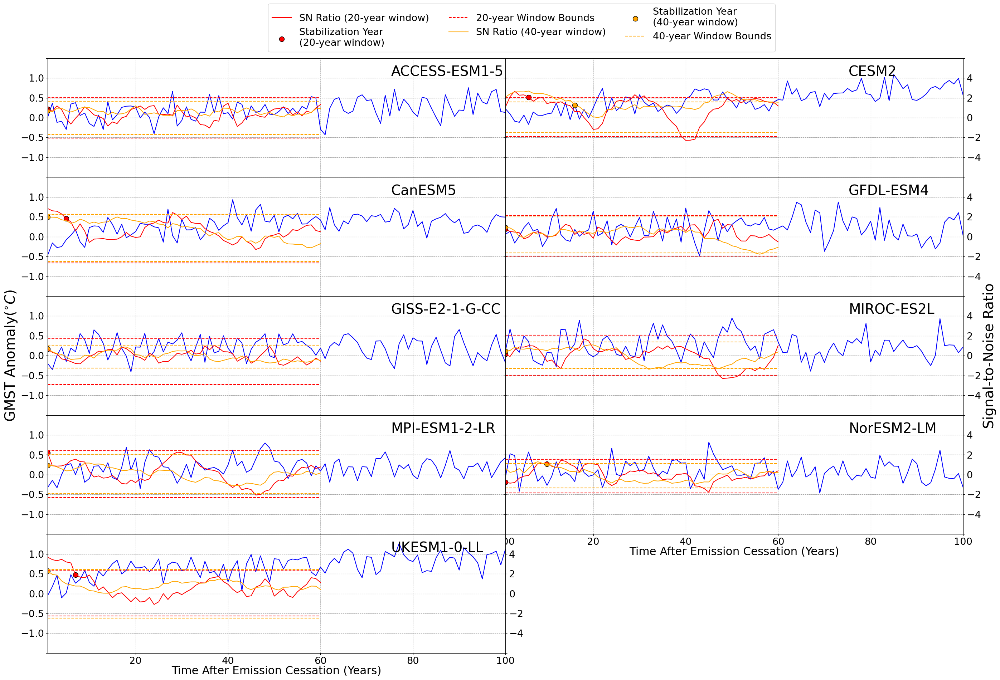

In [115]:
num_plots = len(a1_anom_ds.model.values)
num_cols = 2
num_rows = int(np.ceil(num_plots/num_cols))
fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width']*1.5,  sn_plotting.plot_kwargs['height']*num_plots/5))
gs = gridspec.GridSpec(num_rows, num_cols, wspace=0, hspace=0)
print(num_plots, num_cols, num_rows)
axes = [fig.add_subplot(gs[i]) for i in range(nplots-2)]
fig = plot_lat_lon_value_and_sn(a1_anom_ds, sn_multi_rolling_ds.isel(time=slice(None, 60)), rolling_year_stable_local, location,
                                fig=fig, gs=gs, axes=axes, config=dict(**location_minmaxstep, vmax2=6, max_stabilisation_year = 40))

# Remove xticklabels for all bust last axis -  ends can still be seen otherwise
[ax.set_xticklabels([]) for num, ax in enumerate(axes) if num < 6];

In [116]:
location.value

(-54, 145.69)

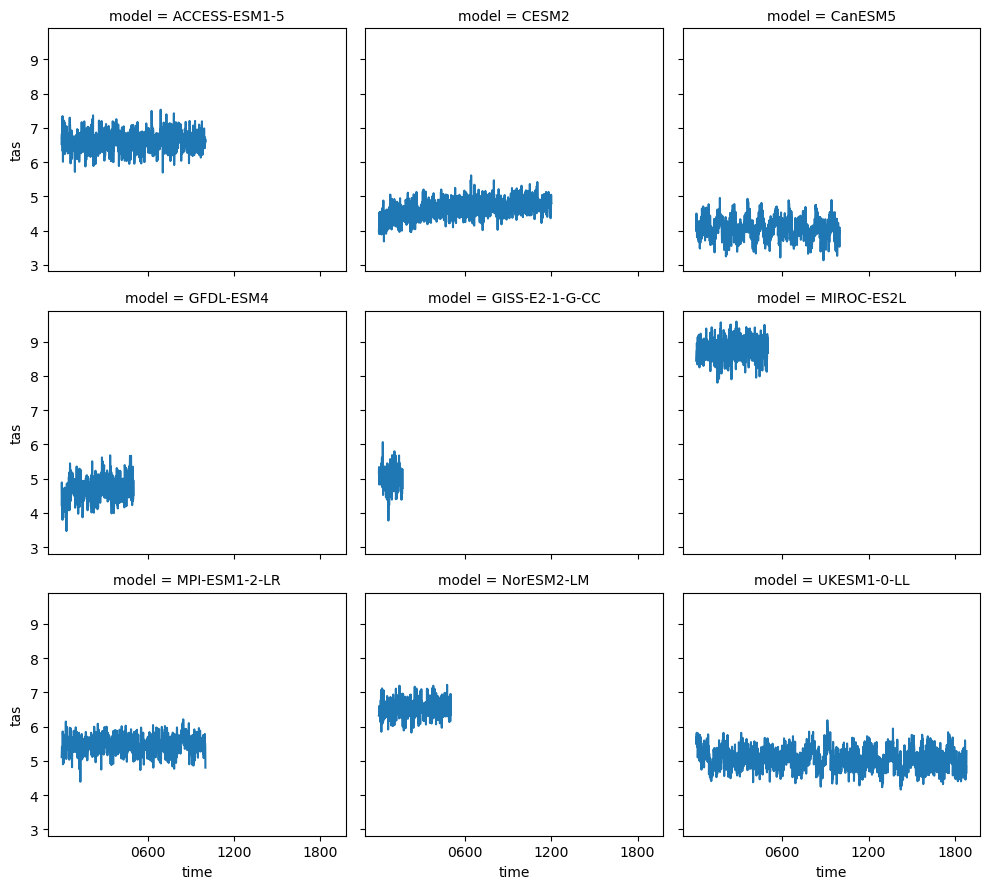

In [117]:
esmpi_ds.sel(lat=location.value[0], lon=location.value[1], method='nearest').plot(col='model',  col_wrap=3)

In [118]:
# location = classes.locationsLatLon2.SOUTHERN_OCEAN
# fig = plot_lat_lon_value_and_sn(a1_anom_ds, sn_multi_rolling_ds.isel(time=slice(None, 60)),
#                           rolling_year_stable_local,location, step=1, vmax=4, vmin=-4, vmax2=6, max_stabilisation_year = 40)

In [119]:
# location = classes.locationsLatLon2.SOUTHERN_OCEAN

# nplots = len(a1_anom_ds.model.values)
# fig = plt.figure(figsize=(12, 3*nplots))
# gs = gridspec.GridSpec(nplots, 1, wspace=0, hspace=0)
# axes = [fig.add_subplot(gs[i]) for i in range(nplots)]
# fig = plot_lat_lon_value_and_sn(a1_anom_ds, sn_multi_rolling_ds.isel(time=slice(None, 60)), rolling_year_stable_local, location,
#                                 fig=fig, gs=gs, axes=axes, config=dict(step=.2, vmax=1.4, vmin=-1.2, vmax2=6, max_stabilisation_year = 40))

# Geo2D

In [295]:
# One projeciton for when it is to be passed into a function. The other is when I am using it here.
# The passed function version also then used the same central longitude.
projection = ccrs.PlateCarree
projection_init = ccrs.PlateCarree(central_longitude=np.mean(year_stable_model_average.lon.values))

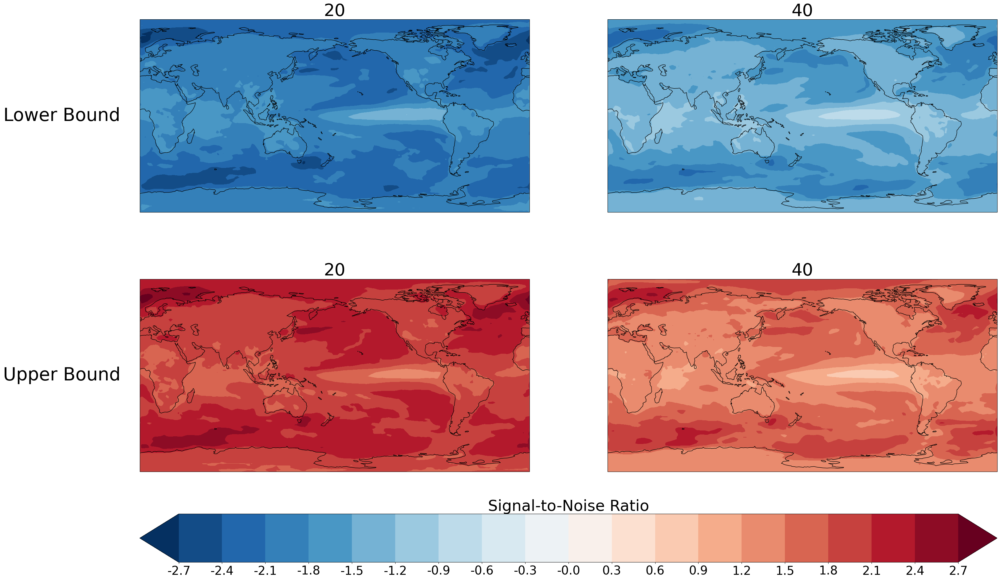

In [127]:
# All mean value plots
ntypes = 2

fig = plt.figure(figsize=(18*2, 12*ntypes))
gs = gridspec.GridSpec(3, 2, height_ratios = [1, 1, 0.2], hspace=0.1)
# projection = ccrs.Robinson(central_longitude=int(np.mean(rollling_year_stable_local_average.lon.values)))

all_axes = []

bound = 2.7; step=0.3; signal_to_noise_levels = np.arange(-bound, bound+step, step)

fig, gs, axes = sn_plotting.map_plot_all_for_coords_3(
    sn_multi_rolling_ds.mean(dim='model')['lower_bound'], dim='window',
    levels=signal_to_noise_levels, projection=projection, cmap='RdBu_r',
    cbar_title="Signal-to-Noise Ratio",
    fig=fig, gs=gs,
    axes = [fig.add_subplot(gs[0, 0], projection=projection_init),
            fig.add_subplot(gs[0, 1], projection=projection_init)],
#     cax = [plt.subplot(gs[1, :])],
    add_colorbar=False,
    **universaL_kwargs)

all_axes.extend(axes)

fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    sn_multi_rolling_ds.mean(dim='model')['upper_bound'], dim='window',
    levels=signal_to_noise_levels, cmap='RdBu_r',
    cbar_title="Signal-to-Noise Ratio",
    fig=fig, gs=gs,
    axes = [fig.add_subplot(gs[1, 0], projection=projection_init),
            fig.add_subplot(gs[1, 1], projection=projection_init)],
    cax = [plt.subplot(gs[2, :])],
    **universaL_kwargs)
all_axes.extend(axes)


y_axis_kwargs = dict(xy=(-0.2, 0.5), ha='center', va='center',
                     xycoords='axes fraction', rotation=0, size=21*universaL_kwargs['font_scale'])
row_labels = ['Lower Bound', 'Upper Bound']
for num, ax in enumerate(all_axes):
    #plotting_functions.add_figure_label(ax, f'{chr(97+num)})', font_scale=universaL_kwargs['font_scale'])
    if num%2 == 0: ax.annotate(row_labels[int(num/2)], **y_axis_kwargs)

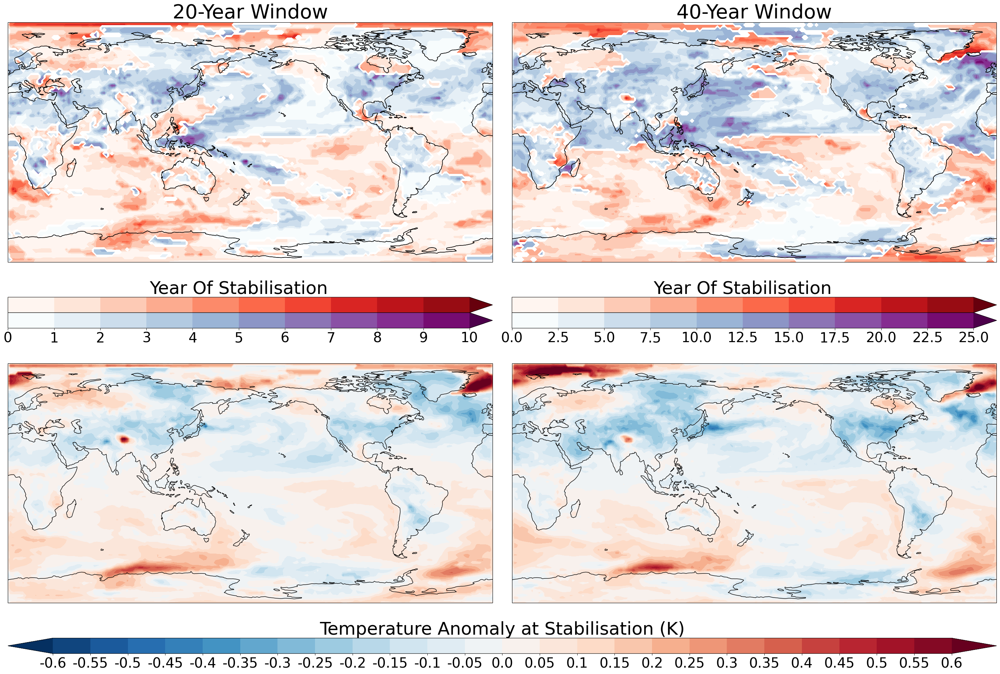

In [131]:
# All mean value plots
ntypes = 2

fig = plt.figure(figsize=(18*2, 12.5*ntypes))
gs = gridspec.GridSpec(ntypes*3, 2, height_ratios = [1, 0.05, 0.05]*ntypes, hspace=0, wspace=0.04)

universaL_kwargs = dict(ncols=2, font_scale=2, add_label=False, projection=projection)

### Year of Stabilisation
vm=25; step=2.5; levels_mean_stab2 = np.arange(0, vm+step, step)
vm=10; step=1; levels_mean_stab1 = np.arange(0, vm+step, step)


# Create tha xis and color axis
top_axes = [fig.add_subplot(gs[0, 0], projection=projection_init), fig.add_subplot(gs[0, 1], projection=projection_init)]
bottom_axes = [fig.add_subplot(gs[3, 0], projection=projection_init), fig.add_subplot(gs[3, 1], projection=projection_init)]
top_cax1 = [plt.subplot(gs[1, 0]), plt.subplot(gs[1, 1])]
bottom_cax1 = [plt.subplot(gs[2, 0]), plt.subplot(gs[2, 1])]
cax2 = [plt.subplot(gs[4, :])]

top_kwargs = dict(dim='window',levels=[levels_mean_stab1, levels_mean_stab2], extend='max', title_tag='-Year Window')

fig, gs, axes, cbar1 = sn_plotting.map_plot_all_for_coords_3(
    rollling_year_stable_local_average['average_value'].squeeze().where(stable_anom_da.mean(dim='model')>0),
    fig=fig, gs=gs, axes = top_axes,  cbar_title="Year Of Stabilisation", cmap='Reds', cax = top_cax1,
    **universaL_kwargs, **top_kwargs)

fig, gs, axes, cbar2 = sn_plotting.map_plot_all_for_coords_3(
    rollling_year_stable_local_average['average_value'].squeeze().where(stable_anom_da.mean(dim='model')<0),
    fig=fig, gs=gs, axes = top_axes, cmap='BuPu', cax = bottom_cax1,
    **universaL_kwargs, **top_kwargs)

# Remove the xticklabels and the xticks from the top colorbar
[cbar.ax.set_xticklabels([]) for cbar in cbar1]
[cbar.ax.set_xticks([]) for cbar in cbar1]

### Temperature Anomaly at Stabilisation
vm = .6; step=.05; levels_mean_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    stable_anom_da.mean(dim='model'), dim='window', levels=levels_mean_anom, cbar_title="Temperature Anomaly at Stabilisation (K)",
    fig=fig, gs=gs, add_title=False, axes = bottom_axes, cax = cax2,**universaL_kwargs)


for ax in bottom_axes: ax.set_title('')

In [133]:
vm = 36; step=3; levels_window_different = np.arange(-vm, vm+step, step) 

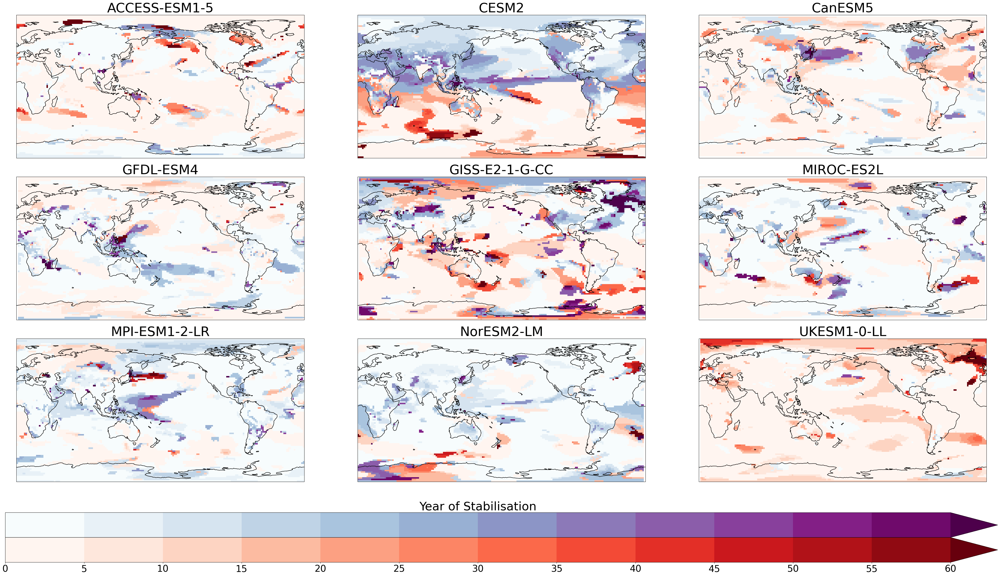

In [137]:

# 20-year window levels
# vm = 30; step=2; levels_stable = np.arange(0, vm+step, step) 
# 40-year window levels
vm = 60; step=5; levels_stable = np.arange(0, vm+step, step) 

window=40

### Figure and axes creation

# If `fig` is not provided, create a new figure with the specified size (default: 18*nrows x 10*ncols).
# If `fig` is already provided, use the existing figure.
# Calculate the total number of plots.
ncols, nrows = 3, 3
num_plots = ncols * nrows

fig = plt.figure(figsize=(18*nrows, 10*ncols))
gs_top = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.15]*2, wspace=.1)
gs_bottom = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.15]*2, hspace=0)

axes = [fig.add_subplot(gs_top[i], projection=projection_init) for i in range(0, num_plots)]
cax1 = plt.subplot(gs_bottom[nrows+0, :])
cax2 = plt.subplot(gs_bottom[nrows+1, :])

### Small calculations - splitting into warm stable and cool stable
year_stable_ds = rolling_year_stable_local.sel(window=window).time.squeeze()
stable_warm_ds = year_stable_ds.where(stable_anom_da.sel(window=window)>0)
stable_cool_ds = year_stable_ds.where(stable_anom_da.sel(window=window)<0)

### Data plotting
# , stabilisation_method = 'blackout'
stable_plot_kwargs = dict(dim='model', levels=levels_stable, extend='max', add_label=False,
    max_stabilisation_year=60, stabilisation_method='blackout', font_scale=2, projection=ccrs.PlateCarree, ptype='imshow')

fig, gs, axes, cbar1 = sn_plotting.map_plot_all_for_coords_3(
    stable_cool_ds, fig=fig, gs=gs_top, axes=axes, cax=cax1, cmap='BuPu',
    cbar_title="Year of Stabilisation", **stable_plot_kwargs)

fig, gs, axes, cbar2 = sn_plotting.map_plot_all_for_coords_3(
    stable_warm_ds, fig=fig, gs=gs_top, axes=axes, cax=cax2, cmap='Reds', **stable_plot_kwargs)

cbar1[0].ax.set_xticklabels([]);
cbar1[0].ax.set_xticks([]);

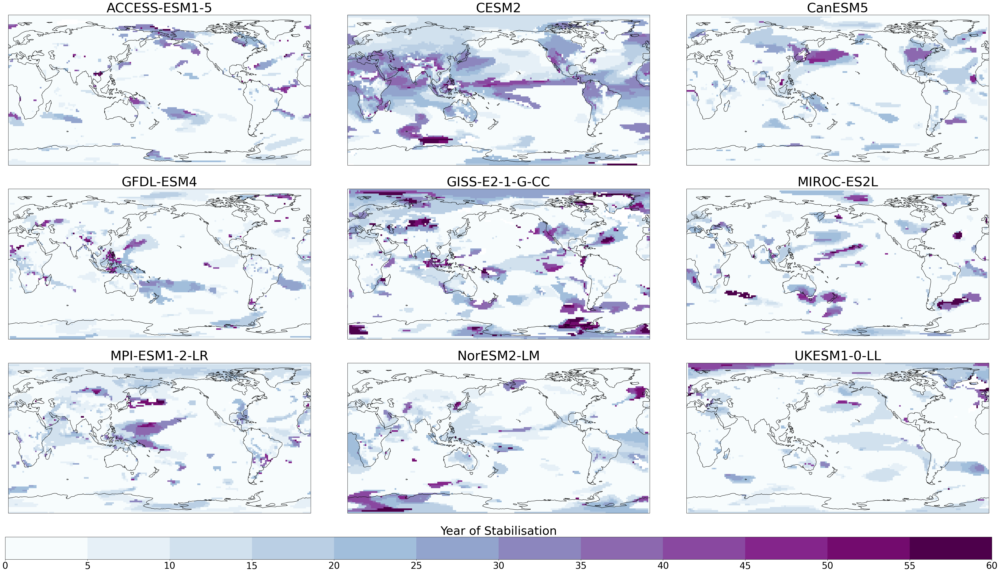

In [138]:
vm = 60; step=5; levels_stable = np.arange(0, vm+step, step) 
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    rolling_year_stable_local.sel(window=40).time.squeeze(),
    dim='model', levels=levels_stable, cmap='BuPu', extend='neither', ptype='imshow',
    max_stabilisation_year=max_effective_length, stabilisation_method='blackout', add_label=False,
    cbar_title="Year of Stabilisation", font_scale=2, projection=ccrs.PlateCarree)

In [139]:
vm = 1.2; step=.2; levels_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.

- full garbage collection released 39.02 MiB from 65016 reference cycles (threshold: 9.54 MiB)


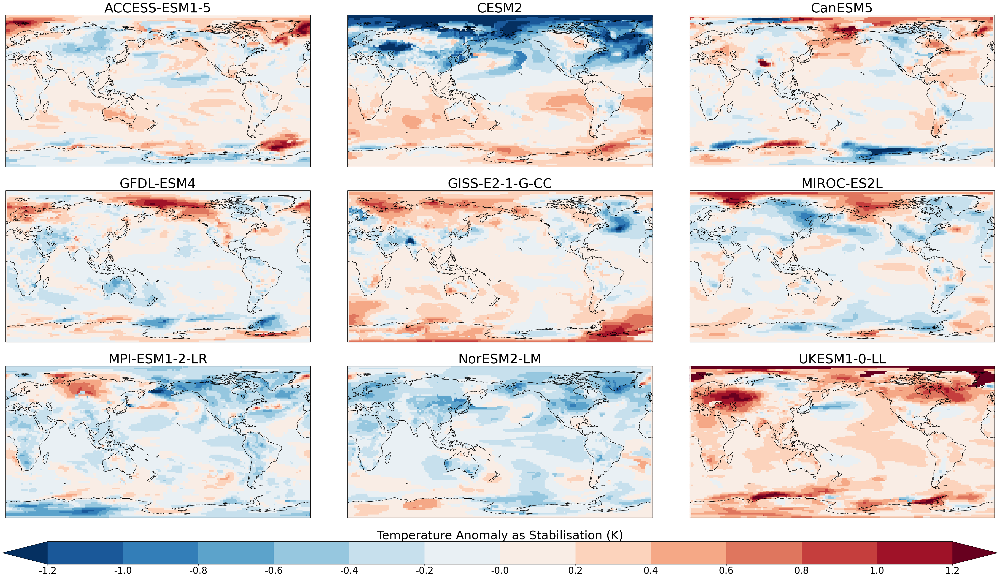

In [140]:
# Temperature anomaly at stabilisation for the year 20
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(stable_anom_da.sel(window=20), dim='model', projection=ccrs.PlateCarree,
                                                      levels=levels_anom, cbar_title="Temperature Anomaly as Stabilisation (K)",
                                                            ptype='imshow', add_label=False, font_scale=2)

In [141]:
def stippling(da, ax):
    X, Y = np.meshgrid(da.lon, da.lat)
    ax.scatter(X,Y, da.values, c='k', transform=ccrs.PlateCarree())

In [142]:
vm = 1.8; step=.2; levels_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.

In [143]:
max_effective_length

60

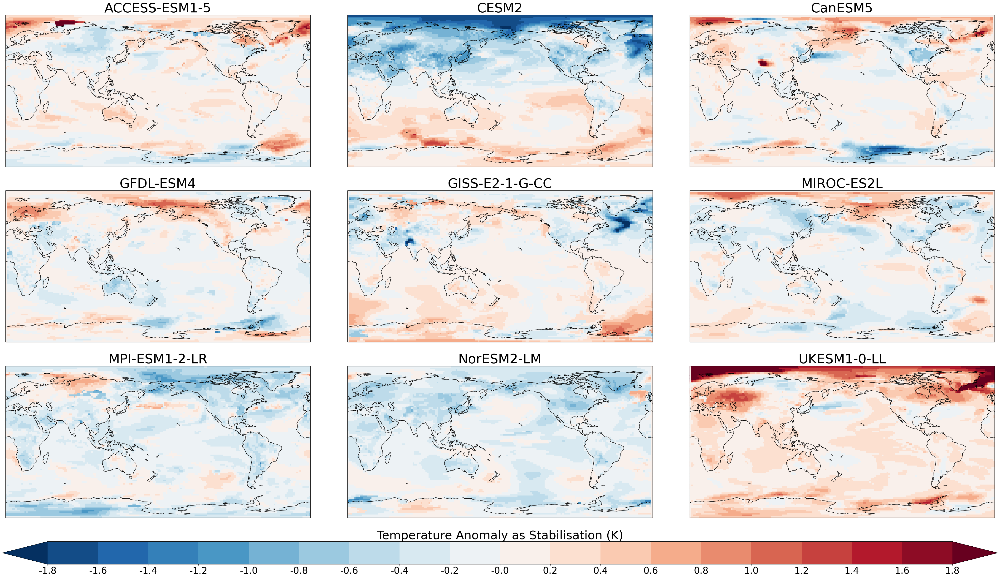

In [144]:
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(stable_anom_da.sel(window=40), dim='model', levels=levels_anom, 
                         cbar_title="Temperature Anomaly as Stabilisation (K)", projection=ccrs.PlateCarree, add_label=False, font_scale=2, 
                                                            logginglevel='ERROR', ptype='imshow')

# # Stippling the regions where stabilisation occurs later than the max effective length
for ax in axes:
    model = ax.get_title()
    da = rolling_year_stable_local.sel(window=40, model=model).time.squeeze()
    da = xr.where(da>max_effective_length, 1,0)
    stippling(da, ax)

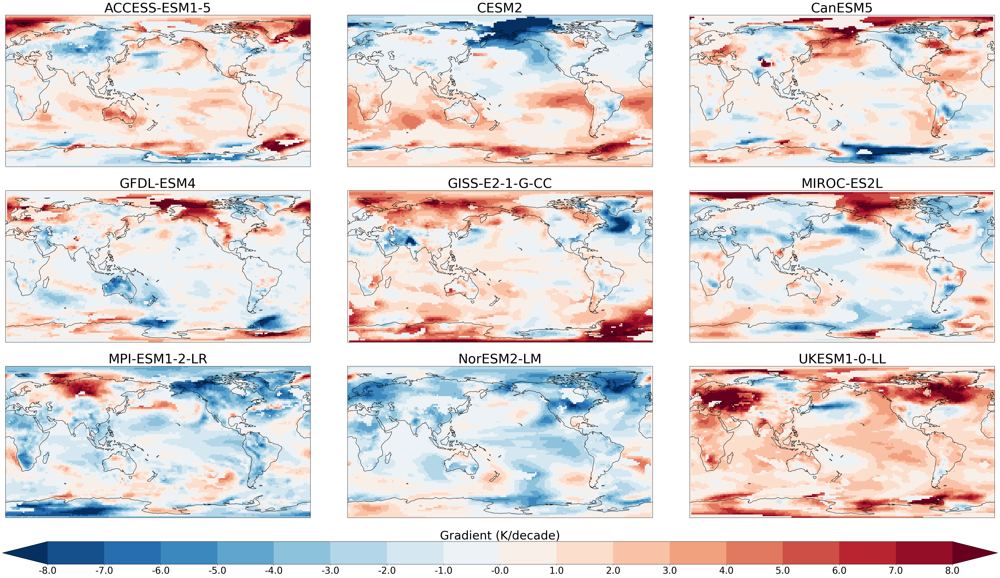

In [145]:
vm = .8; step=.1; levels_grad = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(gradient_da.sel(window=20)*10, dim='model', add_label=False,
                                                      levels=levels_grad*10, cbar_title="Gradient (K/decade)", ptype='imshow',
                                                      font_scale=2, projection=ccrs.PlateCarree,)

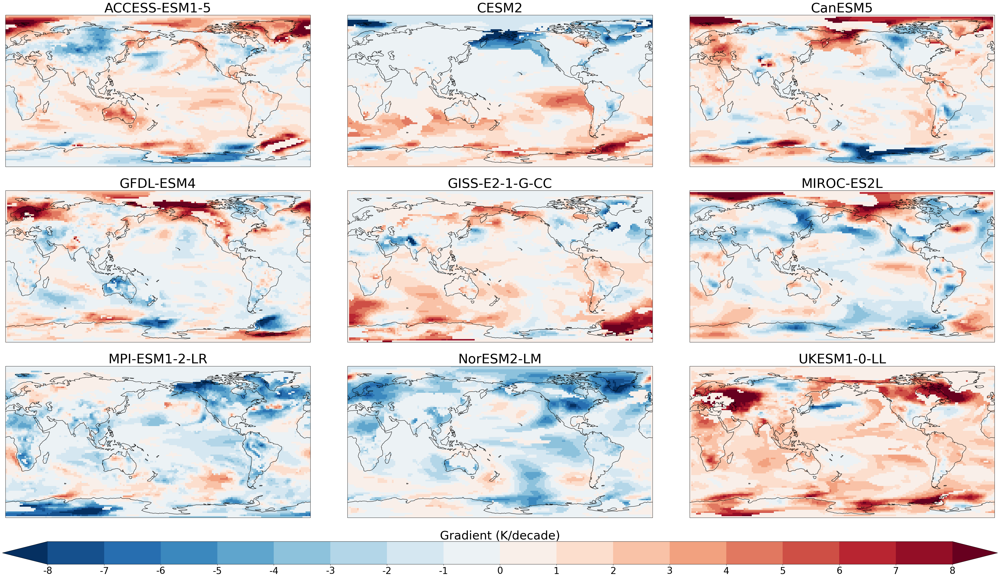

In [146]:
vm = 8; step=1; levels_grad = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(gradient_da.sel(window=40)*10, dim='model', add_label=False,
                                                      levels=levels_grad, cbar_title="Gradient (K/decade)",ptype='imshow',
                                                      font_scale=2, projection=ccrs.PlateCarree,)

# Drift Comparison

In [147]:
#### TODO: Do not import as *. Add drift_functino. as prefix to all necissary functions
from drift_functions import *

In [148]:
# P-values
pi_pval_da = calculate_pvals(esmpi_ds.isel(time=slice(0, 100)))

- full garbage collection released 78.33 MiB from 77475 reference cycles (threshold: 9.54 MiB)


In [149]:
exp_pval_da = calculate_pvals(a1_anom_ds)

- Connection to tcp://127.0.0.1:47038 has been closed.
- Remove worker <WorkerState 'tcp://127.0.0.1:39695', name: 3, status: running, memory: 0, processing: 0> (stimulus_id='handle-worker-cleanup-1714356374.0994933')
- Connection to tcp://127.0.0.1:47030 has been closed.
- Remove worker <WorkerState 'tcp://127.0.0.1:43639', name: 4, status: running, memory: 0, processing: 0> (stimulus_id='handle-worker-cleanup-1714356374.1029782')
- Connection to tcp://127.0.0.1:47046 has been closed.
- Remove worker <WorkerState 'tcp://127.0.0.1:41051', name: 2, status: running, memory: 0, processing: 0> (stimulus_id='handle-worker-cleanup-1714356374.1048276')
- Connection to tcp://127.0.0.1:47040 has been closed.
- Remove worker <WorkerState 'tcp://127.0.0.1:44727', name: 6, status: running, memory: 0, processing: 0> (stimulus_id='handle-worker-cleanup-1714356374.1065474')
- Connection to tcp://127.0.0.1:47076 has been closed.
- Remove worker <WorkerState 'tcp://127.0.0.1:41293', name: 0, status: ru

2024-04-29 12:06:14,143 - distributed.worker - ERROR - Failed to communicate with scheduler during heartbeat.
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/distributed/comm/tcp.py", line 225, in read
    frames_nosplit_nbytes_bin = await stream.read_bytes(fmt_size)
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/distributed/worker.py", line 1252, in heartbeat
    response = await retry_operation(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/distributed/utils_comm.py", line 455, in retry_operation
    return await retry(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/distributed/utils_comm.py", line 434, in retry


In [ ]:
exp_pval_da.isel(model=0).plot()

In [ ]:
# Just the p-values that are less tha 0.05
pi_sig_da = xr.where(pi_pval_da < 0.05, 1, np.nan)#.astype(int)
exp_sig_da = xr.where(exp_pval_da < 0.05, 1, np.nan)#.astype(int)

In [ ]:
fig = plt.figure(); ax = fig.add_subplot(111, projection=ccrs.Robinson())
sn_plotting.plot_stippled_data(pi_sig_da.isel(model=0), ax)

In [ ]:
# Calculating the gradient over the 100 year run length
gradient_exp_full_da = calculate_trend(a1_anom_ds);
gradient_pi_full_da = calculate_trend(esmpi_ds.isel(time=slice(0, 100)))

In [ ]:
# Multiplying gradient by 50 to get K per 50 years
gradient_exp_full_da = (gradient_exp_full_da*50).persist()
gradient_pi_full_da = (gradient_pi_full_da*50).persist()

In [ ]:
# Difference in the gradients
gradient_full_diff = gradient_exp_full_da-gradient_pi_full_da

In [ ]:
reload(sn_plotting)

In [ ]:
# All mean value plots
models = gradient_full_diff.model.values
nrows = len(models); ncols = 3
fig = plt.figure(figsize=(6*ncols, 8*ncols))
gs = gridspec.GridSpec(nrows+1, ncols, height_ratios = [1]*nrows +[0.2], hspace=.2, wspace=0)
projection = ccrs.PlateCarree(central_longitude=int(np.mean(gradient_full_diff.lon.values)))

drift_plot_levels = np.arange(-1.4, 1.4, .2)
drift_plot_kwargs = dict(levels=drift_plot_levels, extend='both', cmap='RdBu_r', add_label=False, font_scale=0.7)
vm =40; step=5; levels_mean_stab2 = np.arange(0, vm+step, step)
all_axes = []

### A1

fig, gs, axes1 = sn_plotting.map_plot_all_for_coords_3(
    gradient_exp_full_da, dim='model',
    fig=fig, gs=gs, add_colorbar=False, stipling_da=exp_sig_da,
    axes = [fig.add_subplot(gs[i, 0], projection=projection) for i in range(len(models))],
    **drift_plot_kwargs)

for num, (ax, model) in enumerate(zip(axes1, models)):
    # ax.set_ylabel(model, labelpad=500)
    # sn_plotting.plot_stippled_data(pi_sig_da.sel(model=model), ax) # TODO: This is not working in the `map_plot_all_for_coords_3` function
    if num == 0: ax.set_title('A1 Experiment', fontsize=constants.PlotConfig.title_size*drift_plot_kwargs['font_scale'])
    else: ax.set_title('')
    
y_axis_kwargs = dict(xy=(-.25, 0.5), ha='center', va='center', xycoords='axes fraction', rotation=0,
                     size=constants.PlotConfig.title_size*drift_plot_kwargs['font_scale'])
for model, ax in zip(models, axes1): ax.annotate(model, **y_axis_kwargs)
all_axes.extend(axes1)


#### Pi-control

fig, gs, axes2 = sn_plotting.map_plot_all_for_coords_3(
    gradient_pi_full_da, dim='model',
    fig=fig, gs=gs, add_colorbar=False,stipling_da=pi_sig_da, 
    axes = [fig.add_subplot(gs[i, 1], projection=projection) for i in range(len(models))],
    **drift_plot_kwargs)
for ax in axes2: ax.set_title('')
axes2[0].set_title('Pre-Industrial Control', size=constants.PlotConfig.title_size*drift_plot_kwargs['font_scale'])

all_axes.extend(axes2)

### Diff

fig, gs, axes3, cbar = sn_plotting.map_plot_all_for_coords_3(
    gradient_full_diff, dim='model',
    cbar_title="Gradient (K /(50 year))", fig=fig, gs=gs,
    axes = [fig.add_subplot(gs[i, 2], projection=projection) for i in range(len(models))],
    cax = plt.subplot(gs[nrows, :]), 
    **drift_plot_kwargs)


for ax in axes3: ax.set_title('')
axes3[0].set_title('Difference', size=constants.PlotConfig.title_size*drift_plot_kwargs['font_scale'])
all_axes.extend(axes3)

#for num, ax in enumerate(all_axes): plotting_functions.add_figure_label(ax, f'{chr(97+num)})', font_scale=0.7)

# Experimental Signal Calculation
Average signal in the first 20 years


In [ ]:
av_sig_ds = sn_multi_rolling_ds.signal.isel(time=slice(0, 19)).mean(dim='time')

In [ ]:
av_sig_ds.isel(window=0).plot(col='model', col_wrap=3, robust=True)


#client.close()

# To Delete

In [25]:
# lat_step = np.unique(np.diff(a1_raw_xrlist['MPI-ESM1-2-LR'].lat.values)).round(2)[0]
# lon_step = np.unique(np.diff(a1_raw_xrlist['MPI-ESM1-2-LR'].lon.values)).round(2)[0]
# lat_step, lon_step

# # Define the latitude and longitude values
# # lat_values = np.arange(85.0, -85.1, -1.0)
# # lon_values = np.arange(7.5, 352.5, 1.25)
# lat_values = np.arange(90, -90, -lat_step)
# lon_values = np.arange(0, 360, lon_step)
# # Create the mock dataset
# mock_ds = xr.Dataset(
#     coords={
#         "lat": xr.DataArray(lat_values, dims="lat"),
#         "lon": xr.DataArray(lon_values, dims="lon")
#     }
# )

# # Add a dummy variable to the dataset (optional)
# mock_ds["tas"] = xr.DataArray(
#     np.zeros((len(lat_values), len(lon_values))),
#     dims=["lat", "lon"]
# )#['tas']
# mock_ds = mock_ds.tas